This is a notebook file for postprocess all the rasters and other files:
- Remove outliers from the sd rasters

In [1]:
import os
import xarray as xr
import rioxarray as rxr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np
from metloom.pointdata import SnotelPointData
import pandas as pd
import geopandas as gpd
from datetime import datetime, timedelta
from rasterio.crs import CRS
import rasterstats as rs
from rasterstats import point_query, zonal_stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr
from scipy.stats import linregress
import rasterio

# Set the font size and style
plt.rcParams.update({'font.size': 16, 'font.family': 'Helvetica'})

In [70]:
# DEM_raster = rxr.open_rasterio('/SNOWDATA/IDALS/2024/20231228/20231228_MCS/ice-road/20231228_MCS-snow.tif', masked = True)
# DEM_raster2 = rxr.open_rasterio('/SNOWDATA/IDALS/2024/20231228/20231228_MCS_v2/ice-road/20231228_MCS_v2-snow.tif', masked = True)
# DEM_raster2 = DEM_raster2.rio.reproject_match(DEM_raster)
# diff = DEM_raster - DEM_raster2
# fig, ax = plt.subplots( figsize=(14, 12))
# im = diff.plot(ax=ax, cmap= 'bwr_r', robust = True, cbar_kwargs={'label': 'DEM Difference[v1 - v2] (m)'})
# ax.set_title('')
# ax.set_aspect('equal')
# ax.set_xlabel('Easting (Km)')
# ax.set_ylabel('Northing (Km)')
# # Format x and y-axis labels to subtract leading digits
# ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
# ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
# plt.tight_layout()
# plt.show()

In [13]:
def plot_raster(raster_path,  cmap = 'viridis', cbar_label = 'Snow Depth (m)', title = ''):
    import matplotlib.pyplot as plt
    import matplotlib.ticker as ticker
    sd_raster = rxr.open_rasterio(raster_path, masked=True)
    fig, ax = plt.subplots(figsize=(14, 12))
    im = sd_raster.plot(ax=ax, cmap=cmap, robust=True, cbar_kwargs={'label': cbar_label})
    ax.set_title(title)
    ax.set_aspect('equal')
    ax.set_xlabel('Easting (Km)')
    ax.set_ylabel('Northing (Km)')
    # Format x and y-axis labels to subtract leading digits
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
    plt.tight_layout()
    plt.show()

Let's derive slope, aspect from dem and reproject the vh to match the dem and save to topo features folder

In [ ]:
# from osgeo import gdal

# # Open the DEM raster
# dem_path = '/SNOWDATA/IDALS/misc_data_scripts/dem.tif'
# dem_ds = gdal.Open(dem_path)

# # Calculate the slope and aspect rasters using gdaldem
# slope_path = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/slope.tif'
# aspect_path = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/aspect.tif'
# gdal.DEMProcessing(slope_path, dem_ds, 'slope')
# gdal.DEMProcessing(aspect_path, dem_ds, 'aspect')

# # Close the DEM raster
# dem_ds = None

# vh = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/Mores_VH.tif')
# vh_repro = vh.rio.reproject_match(dem, no_data = np.nan)
# vh_repro.rio.to_raster('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/vh.tif')


## prepare data

- Outlier filter for sd
- calculate the sdv
- Extract the values into dataframe


In [2]:
sd_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/lidar-snowdepth/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
            '/SNOWDATA/IDALS/2021/20210310_MCS/ice-road/20210310_MCS-snowdepth.tif',
            '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/lidar-snowdepth/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
            '/SNOWDATA/IDALS/2022/20220217_MCS/ice-road/20220217_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2022/20220317_MCS/ice-road/20220317_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2022/20220407_MCS/ice-road/20220407_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20221208_MCS/ice-road/20221208_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20230209_MCS_v2/ice-road/20230209_MCS_v2-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20230316_MCS/ice-road/20230316_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/hanover_reprocess_20230405/ice-road/hanover_reprocess-snowdepth.tif',
            '/SNOWDATA/IDALS/2024/20231113/20231113_MCS/ice-road/AntHeightCorrected-snowdepth.tif',
            '/SNOWDATA/IDALS/2024/20231228/20231228_MCS_v2/ice-road/20231228_MCS_v2-snowdepth.tif',
            '/SNOWDATA/IDALS/2024/20240115/20240115_MCS/ice-road/20240115_MCS-snowdepth.tif']


Dates = ["02/09/2020", "03/10/2021","03/15/2021", "02/17/2022", "03/17/2022", "04/07/2022", "12/08/2022", "02/09/2023", "03/16/2023", "04/05/2023", "11/13/2023", '12/28/2023', '01/15/2024']

#dem to align all rasters to
dem = rxr.open_rasterio('/SNOWDATA/IDALS/misc_data_scripts/dem.tif', masked = True)

In [ ]:
# snotel = [1.8034, 1.9812, 1.8796, 1.3970, 1.3462, 0.9906, 0.9652, 1.6510, 2.3368, 2.7178] #delete this cell

In [4]:
# #open and flatten topo features ---> Delete ths cell
# veg_path = "/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/vh.tif"
# slope_path = "/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/slope.tif"
# asp_path = "/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/aspect.tif"

# elev = dem.values.flatten()
# vh = rxr.open_rasterio(veg_path, masked = True).values.flatten()
# slope = rxr.open_rasterio(slope_path, masked = True).values.flatten()
# asp = rxr.open_rasterio(asp_path, masked = True).values.flatten()

In [3]:
def prepare(sd_files, upper_filter = 5):
    for i in range(len(sd_files)):
        sd = rxr.open_rasterio(sd_files[i], masked = True)
        #reproject to match
        sd = sd.rio.reproject_match(dem)
        #set negative snowdepth values to 0 and filter out the snow depth values greater than mean + 5 * std
        sd.values[sd.values < 0] = 0
        sd_mean = sd.mean()
        sd_std = np.nanstd(sd.values)
        threshold = sd_mean + upper_filter * sd_std #mean + 5*std
        sd_f = sd.where(sd <= threshold)
        print(sd_files[i])
        print(f'Mean : {sd.mean().item()}, Std; {sd_f.std().item()}\n')
        print("---------------------------------------------------------")
        basename = os.path.basename(sd_files[i])
        folder = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/'
        out_path = os.path.join(folder, basename)
        sd_f.rio.to_raster(out_path)
        # Normalize to standardized depth value
        sd_norm3 = (sd_f - sd_f.mean())/sd_f.std()
        folder = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv'
        out_path = os.path.join(folder, basename)
        sd_norm3.rio.to_raster(out_path)

In [ ]:
prepare(sd_files)

In [4]:
sd = ['/SNOWDATA/IDALS/2024/20231228/20231228_MCS_v2/ice-road/20231228_MCS_v2-snowdepth.tif']
prepare(sd)

/SNOWDATA/IDALS/2024/20231228/20231228_MCS_v2/ice-road/20231228_MCS_v2-snowdepth.tif
Mean : 0.6312417387962341, Std; 0.31178954243659973

---------------------------------------------------------


/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rioxarray/raster_writer.py:132: UserWarning: The nodata value (3.402823466e+38) has been automatically changed to (3.4028234663852886e+38) to match the dtype of the data.
  warnings.warn(


### Validating the data

Now that the LiDAR derived snow depth has been post-processed (filtered for outlier), let's validate the data with probe measurements

In [7]:
def lidar_val(lid_path, csv_path, snowdepth_col, lat_col, lon_col, csv_EPSG=4326, zone_utmcrs=32611, lid_unit="m", probe_unit="cm", use_buffer = 'no'):
    # read the lidar raster data
    lidar = rxr.open_rasterio(lid_path, masked = True)
    #reproject to crs of the zone
    if lidar.rio.crs.to_string() != "EPSG:" + str(zone_utmcrs):
        lidar = lidar.rio.reproject(CRS.from_string("EPSG:" + str(zone_utmcrs)))
    # read the csv
    df = pd.read_csv(csv_path, usecols=[snowdepth_col, lat_col, lon_col])
    # convert to geodataframe
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df[lon_col], df[lat_col]),
        crs="EPSG:" + str(csv_EPSG),
    )
    # convert the gdf to crs of the zone
    gdf_utm = gdf.to_crs("EPSG:" + str(zone_utmcrs))

    #Extract the LiDAR pixels at pixel or buffered region 
    if use_buffer == "no":
        # sample the snow depth raster values at point locations
        vals = point_query(gdf_utm.geometry, lidar.squeeze().values, affine = lidar.rio.transform(), nodata = -9999)
        # add the values to a new column in the GeoDataFrame
        gdf_utm['lidar'] = vals
    else:
        # buffer the points
        gdf_utm_buffered = gdf_utm.buffer(2)
        # calculate zonal statistics of the mean within the buffer
        vals = zonal_stats(
            gdf_utm_buffered,
            lidar.squeeze().values,
            affine=lidar.rio.transform(),
            nodata=-9999,
            stats="mean",
        )
        # add the values to new columns in the GeoDataFrame
        gdf_utm['lidar'] = [stat["mean"] for stat in vals]

    #convert the unit to m
    if probe_unit == "cm":
        gdf_utm[snowdepth_col] = gdf_utm[snowdepth_col] / 100
    if lid_unit == "cm":
        gdf_utm["lidar"] = gdf_utm["lidar"]/100
    #rename the colums
    gdf_utm.rename(columns={
                       snowdepth_col: 'Probed Snow Depth (m)', 'lidar': 'LiDAR Snow Depth (m)'}, inplace=True)
    #add error column
    gdf_utm['error (cm)'] = (gdf_utm['Probed Snow Depth (m)'] - gdf_utm['LiDAR Snow Depth (m)']) * 100

    #read the road shapefile
    road = gpd.read_file('/SNOWDATA/IDALS/misc_data_scripts/3mroadBufferClip/3m_road.shp')
    # convert the gdf to crs of the zone
    road = road.to_crs("EPSG:" + str(zone_utmcrs))
    #create a 5m buffer
    road_10 = road.buffer(2)
    #sample lidar values overlapping with road_10
    values = zonal_stats(
            road_10,
            lidar.squeeze().values,
            affine=lidar.rio.transform(),
            raster_out=True, stats="mean"
        )
    masked_data = values[0]['mini_raster_array']
    lidar_road = masked_data[~masked_data.mask] 


    return gdf_utm, lidar_road


In [64]:
csv_path = ['/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/validation_data/3-17_PilotsPeak_ppk_pos_PROCESSED.csv',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/validation_data/4-7-22_pilot_ppk_pos_PROCESSED.csv',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/validation_data/MCS20221207_MCS20221207_secondtablet.csv',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/validation_data/MCS20230209_MCS20230209b.csv',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/validation_data/MCS040623_combined.csv']

lid_path = ['/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth.tif',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth.tif',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth.tif',
            '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth.tif']

#This is unfiltered lidar to see distribution on road
unfilteredlid_path = ['/SNOWDATA/IDALS/2022/20220317_MCS/ice-road/20220317_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2022/20220407_MCS/ice-road/20220407_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20221208_MCS/ice-road/20221208_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20230209_MCS_v2/ice-road/20230209_MCS_v2-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/hanover_reprocess_20230405/ice-road/hanover_reprocess-snowdepth.tif']

#pointval
pointVal_20220317, roadpointVal_20220317 = lidar_val(lid_path= unfilteredlid_path[0], csv_path = csv_path[0], snowdepth_col= "Description", lat_col= "Lat", lon_col= "Lon")
pointVal_20220407, roadpointVal_20220407 = lidar_val(lid_path= unfilteredlid_path[1], csv_path = csv_path[1], snowdepth_col= "Description", lat_col= "Lat", lon_col= "Lon")
pointVal_20221208, roadpointVal_20221208 = lidar_val(lid_path= unfilteredlid_path[2], csv_path = csv_path[2], snowdepth_col= "Depth", lat_col= "Latitude", lon_col= "Longitude")
pointVal_20230209, roadpointVal_20230209 = lidar_val(lid_path= unfilteredlid_path[3], csv_path = csv_path[3], snowdepth_col= "Depth", lat_col= "Latitude", lon_col= "Longitude")
pointVal_20230405, roadpointVal_20230405 = lidar_val(lid_path= unfilteredlid_path[4], csv_path = csv_path[4], snowdepth_col= "Depth", lat_col= "Latitude", lon_col= "Longitude")

bufferVal_20220317, roadbufferVal_20220317 = lidar_val(lid_path= unfilteredlid_path[0], csv_path = csv_path[0], snowdepth_col= "Description", lat_col= "Lat", lon_col= "Lon", use_buffer= "yes")
bufferVal_20220407, roadbufferVal_20220407 = lidar_val(lid_path= unfilteredlid_path[1], csv_path = csv_path[1], snowdepth_col= "Description", lat_col= "Lat", lon_col= "Lon", use_buffer= "yes")
bufferVal_20221208, roadbufferVal_20221208 = lidar_val(lid_path= unfilteredlid_path[2], csv_path = csv_path[2], snowdepth_col= "Depth", lat_col= "Latitude", lon_col= "Longitude", use_buffer= "yes")
bufferVal_20230209, roadbufferVal_20230209 = lidar_val(lid_path= unfilteredlid_path[3], csv_path = csv_path[3], snowdepth_col= "Depth", lat_col= "Latitude", lon_col= "Longitude", use_buffer= "yes")
bufferVal_20230405, roadbufferVal_20230405 = lidar_val(lid_path= unfilteredlid_path[4], csv_path = csv_path[4], snowdepth_col= "Depth", lat_col= "Latitude", lon_col= "Longitude", use_buffer= "yes")


/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rasterstats/io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rasterstats/io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rasterstats/io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rasterstats/io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
/home/naheemadebisi/miniconda3/e

In [11]:
def plot_val(df, roadlidar, title = ''):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 6))
    # Drop missing values
    df = df.dropna(subset=['Probed Snow Depth (m)', 'LiDAR Snow Depth (m)'])

    # Scatter plot of probed depth vs lidar depth
    sns.regplot(x='Probed Snow Depth (m)', y='LiDAR Snow Depth (m)', data=df, ax=axs[0])
    # axs[0].set_xlabel('Probed Snow Depth (m)')
    # axs[0].set_ylabel('Predicted Snow Depth (m)')

    # Calculate correlation (r) and RMSE
    corr = np.corrcoef(df['Probed Snow Depth (m)'], df['LiDAR Snow Depth (m)'])[0, 1]
    correlation_text = f'r: {corr:.2f}'
    rmse = np.sqrt(mean_squared_error(df['Probed Snow Depth (m)'], df['LiDAR Snow Depth (m)']))
    rmse_text = f'RMSE: {rmse:.2f}'
    mbe = np.mean(df['Probed Snow Depth (m)'] - df['LiDAR Snow Depth (m)'])
    mbe_text = f'MBE: {mbe:.2f}'
    mae = np.mean(np.abs(df['Probed Snow Depth (m)'] - df['LiDAR Snow Depth (m)']))
    mae_text = f'MAE: {mae:.2f}'
    nmad = 1.4826 * np.median(np.abs(df['Probed Snow Depth (m)'] - df['LiDAR Snow Depth (m)']))
    nmad_text = f'NMAD: {nmad:.2f}'

    # Add the correlation coefficient and RMSE as text to the upper left corner
    combined_text = '\n'.join([correlation_text, rmse_text, mbe_text, mae_text, nmad_text])
    axs[0].text(0.02, 0.98, combined_text, transform=axs[0].transAxes, color='black', bbox=dict(facecolor='white', alpha=0.8), ha='left', va='top')

    # Distribution plot of error
    sns.histplot(df['error (cm)'], kde=True, ax=axs[1])
    axs[1].set_xlabel('Error (cm)')
    axs[1].set_ylabel('Frequency')

    #Distribution of lidar_on_road
    axs[2].hist(roadlidar, bins=800,  alpha=0.5, histtype='step', linewidth=2)
    axs[2].set_xlim(-0.4, 0.4)
    axs[2].set_xlabel('Snow Depth on road (m)')
    # Set title and adjust layout and spacing
    plt.suptitle(f'{title}')
    plt.tight_layout()

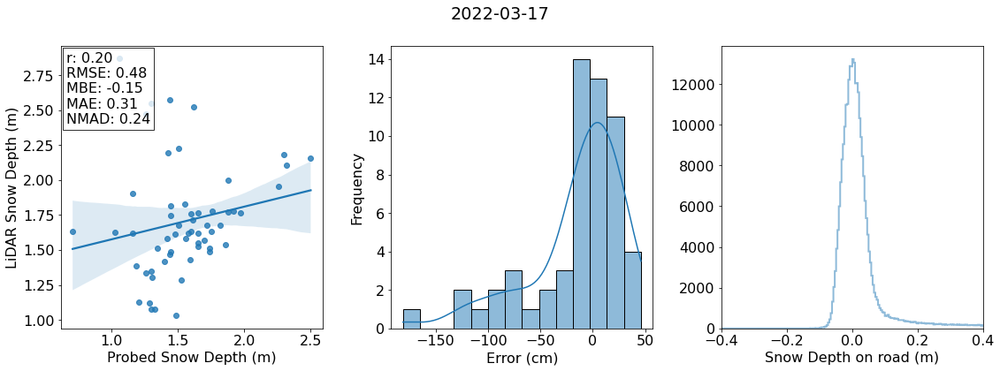

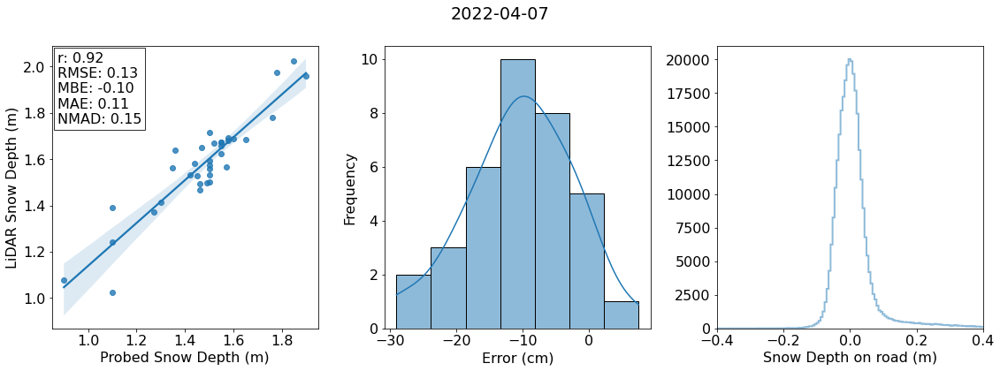

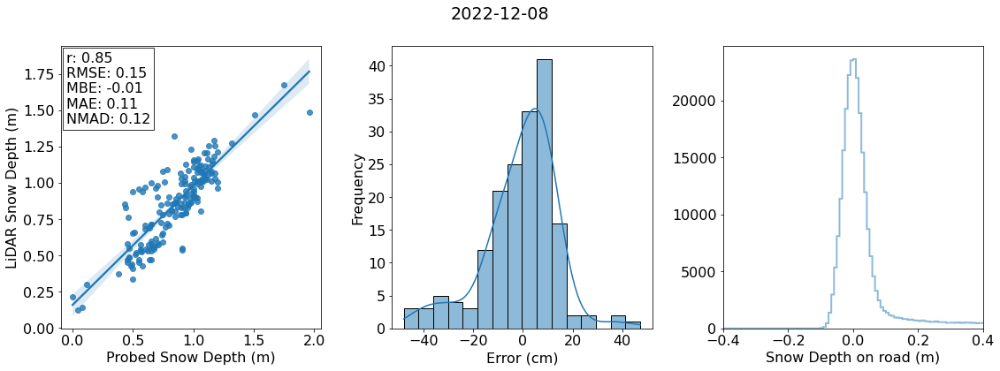

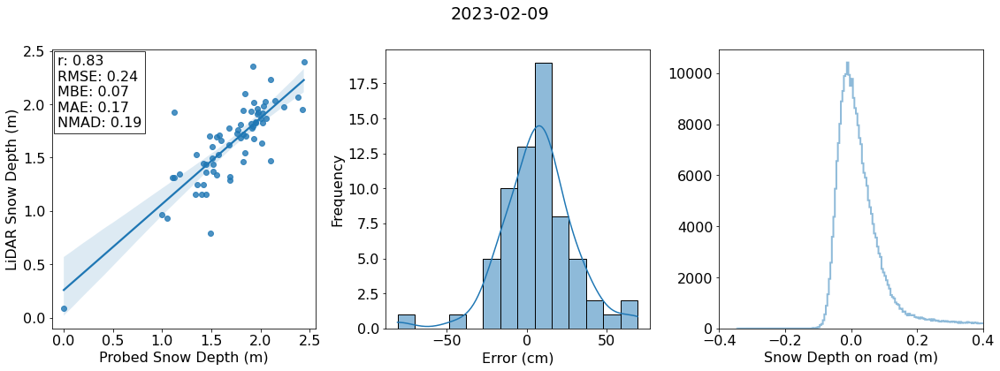

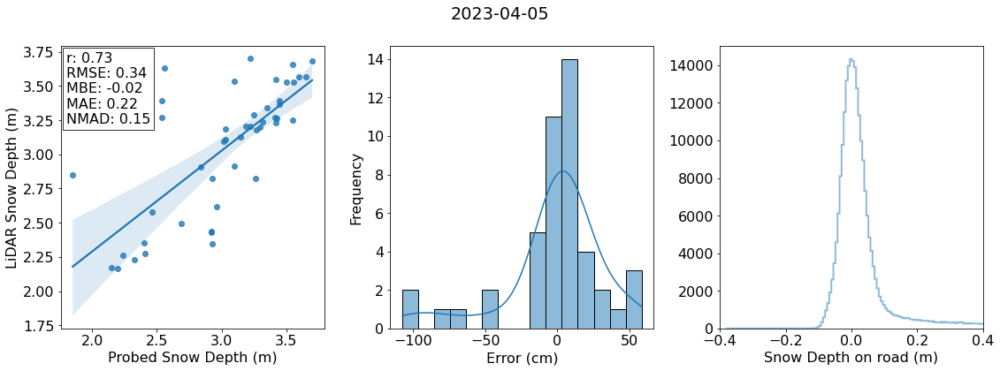

In [68]:
valDF_list = [pointVal_20220317, pointVal_20220407, pointVal_20221208, pointVal_20230209, pointVal_20230405]
road_lid = [roadpointVal_20220317, roadpointVal_20220407, roadpointVal_20221208, roadpointVal_20230209, roadpointVal_20230405]
titles = ['2022-03-17', '2022-04-07', '2022-12-08', '2023-02-09', '2023-04-05']
for df, road_lidar, title in zip(valDF_list, road_lid, titles):
    df= df[df['LiDAR Snow Depth (m)'] >= 0]
    plot_val(df, road_lidar, title)

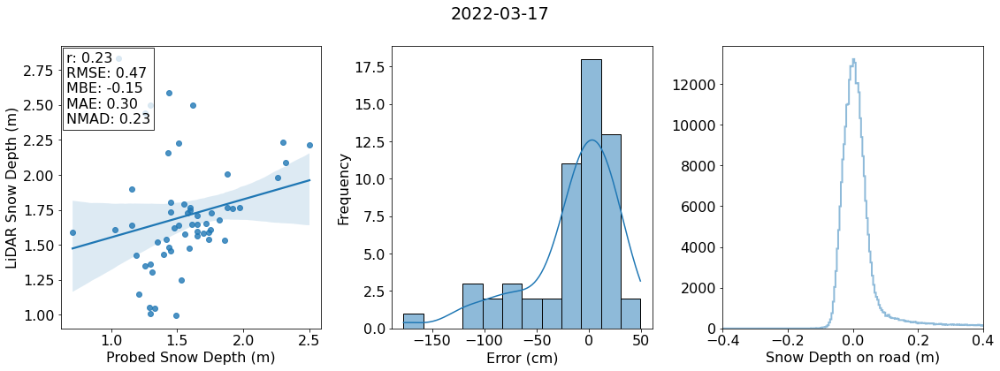

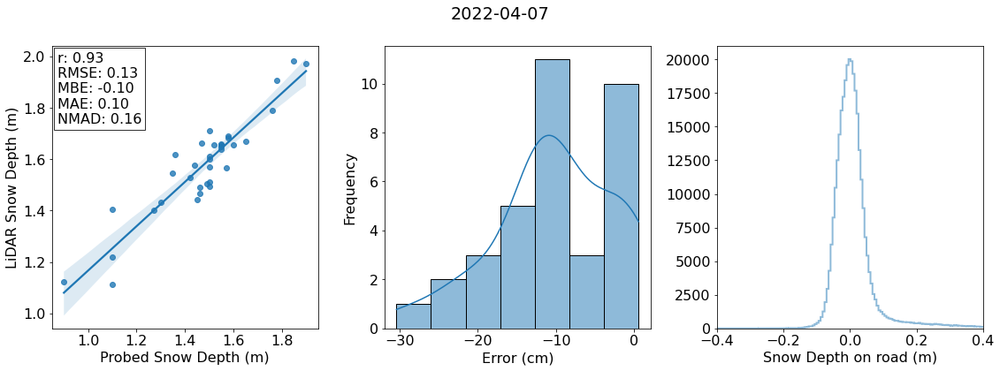

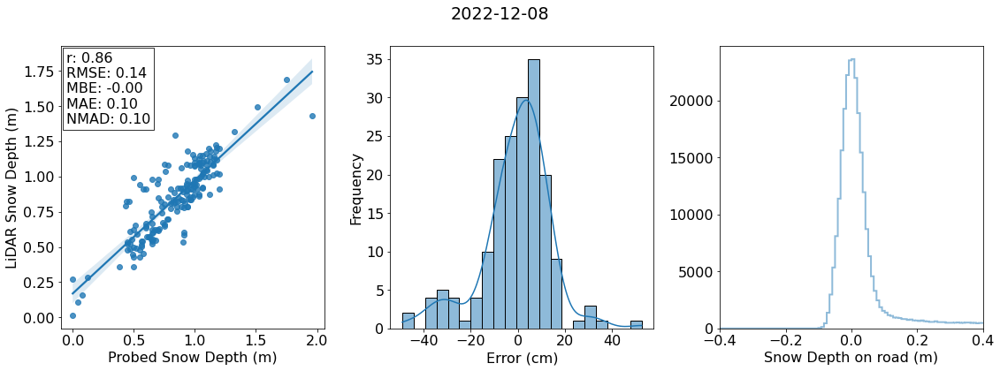

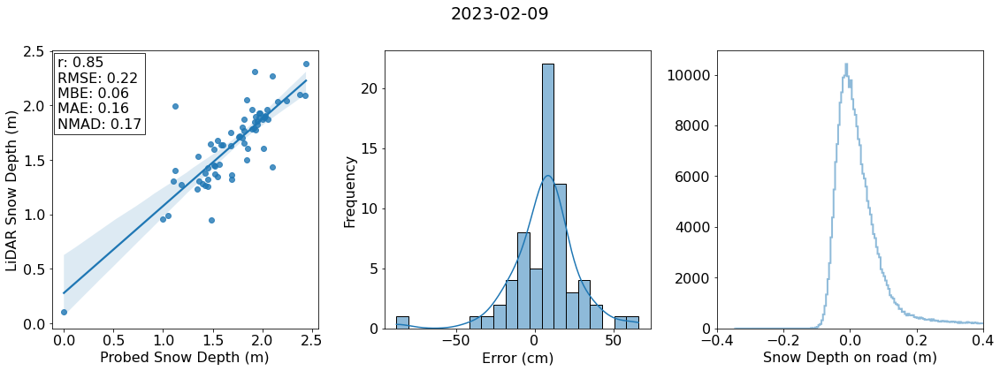

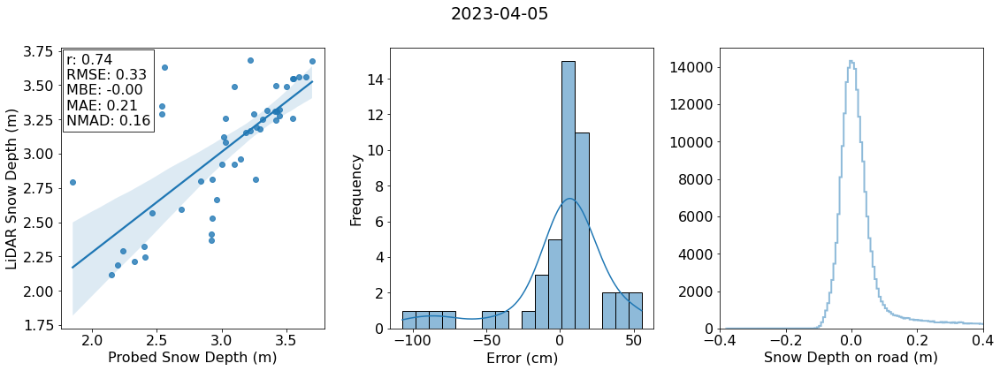

In [69]:
valDF_list = [bufferVal_20220317, bufferVal_20220407, bufferVal_20221208, bufferVal_20230209, bufferVal_20230405]
titles = ['2022-03-17', '2022-04-07', '2022-12-08', '2023-02-09', '2023-04-05']
for df, road_lidar, title in zip(valDF_list, road_lid, titles):
    df= df[df['LiDAR Snow Depth (m)'] >= 0]
    plot_val(df, road_lidar, title)

In [ ]:
# extract_list = []

# for i in range(len(sd_files)):
#     sd = rxr.open_rasterio(sd_files[i], masked = True)
#     #reproject to match
#     sd = sd.rio.reproject_match(dem)
#     #filter and save to raster
#     sd_f = sd.where((sd >= 0) & (sd <= (sd.mean() + np.nanstd(sd.values) * 5)))
#     print(sd_files[i])
#     print(f'Mean : {sd.mean().item()}, Std; {sd_f.std().item()}')
#     basename = os.path.basename(sd_files[i])
#     folder = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/'
#     out_path = os.path.join(folder, basename)
#     sd_f.rio.to_raster(out_path)
#     # Normalize to average sd
#     sd_norm1 = sd_f/sd_f.mean()
#     folder = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/mean_normalized'
#     out_path = os.path.join(folder, basename)
#     sd_norm1.rio.to_raster(out_path)
#     #Normalize to SNOTEL
#     sd_norm2 = sd_f/snotel[i]
#     folder = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/snotel_normalized'
#     out_path = os.path.join(folder, basename)
#     sd_norm2.rio.to_raster(out_path)
#     # Normalize to standardized depth value
#     sd_norm3 = (sd_f - sd_f.mean())/sd_f.std()
#     folder = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv'
#     out_path = os.path.join(folder, basename)
#     sd_norm3.rio.to_raster(out_path)
#     # flatten the sd values
#     snow_depth = sd.values.flatten()
#     snow_depth_f = sd_f.values.flatten()
#     sdv =sd_norm3.values.flatten()
#     mean_norm = sd_norm1.values.flatten()
#     snotel_norm = sd_norm2.values.flatten()

#     # Create a DataFrame
#     data = {'date': Dates[i], 'snow depth': snow_depth,'snow depth filtered': snow_depth_f, 'sdv': sdv, 'mean_norm': mean_norm, 'snotel_norm': snotel_norm, 'elev': elev, 'vh': vh, 'slope': slope, 'aspect': asp}
#     data_df = pd.DataFrame(data)
#     extract_list.append(data_df)

## Plot the timeseries (Snow depth and SDV)

Since November 13 is mostly snow free and not having the pattern similar to others, I will exclude it from further processing.



In [205]:
Dates = ["02/09/2020", "03/10/2021","03/15/2021", "02/17/2022", "03/17/2022", "04/07/2022", "12/08/2022", "02/09/2023", "03/16/2023", "04/05/2023",'11/13/2023', '12/28/2023','01/15/2024']


sdf_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth.tif']

sdv_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20240115_MCS-snowdepth.tif']

In [199]:
sdf_list = []
sdv_list = []

for i in range(len(sdf_files)):
    sdf = rxr.open_rasterio(sdf_files[i], masked = True)
    sdf_list.append(sdf)
    sdv = rxr.open_rasterio(sdv_files[i], masked = True)
    sdv_list.append(sdv)

# Combine the rasters into a single xarray DataArray, using 'time' as the new dimension
sdf_average = (xr.concat(sdf_list, dim=pd.Index(Dates, name='date'))).mean(dim='date')
sdv_average = (xr.concat(sdv_list, dim=pd.Index(Dates, name='date'))).mean(dim='date')
# save the data
sdf_average.rio.to_raster('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif')
sdv_average.rio.to_raster('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif')

# Extract the temporal snow depth and topo and save as a csv

#open and flatten the snow depth and topo features
elev = rxr.open_rasterio('/SNOWDATA/IDALS/misc_data_scripts/dem.tif', masked = True).values.flatten()
vh = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/vh.tif", masked = True).values.flatten()
slope = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/slope.tif", masked = True).values.flatten()
asp = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/aspect.tif", masked = True).values.flatten()
sdf = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif', masked = True).values.flatten()
sdv = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif', masked = True).values.flatten()

# Create a DataFrame
data_temporal = {'Temporal Mean Depth_f': sdf,'Standardized Depth': sdv, 'elev': elev, 'vh': vh, 'slope': slope, 'aspect': asp}
data_temporal_df = pd.DataFrame(data_temporal)
data_temporal_df.to_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/all_extract_temporal_average.csv')

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


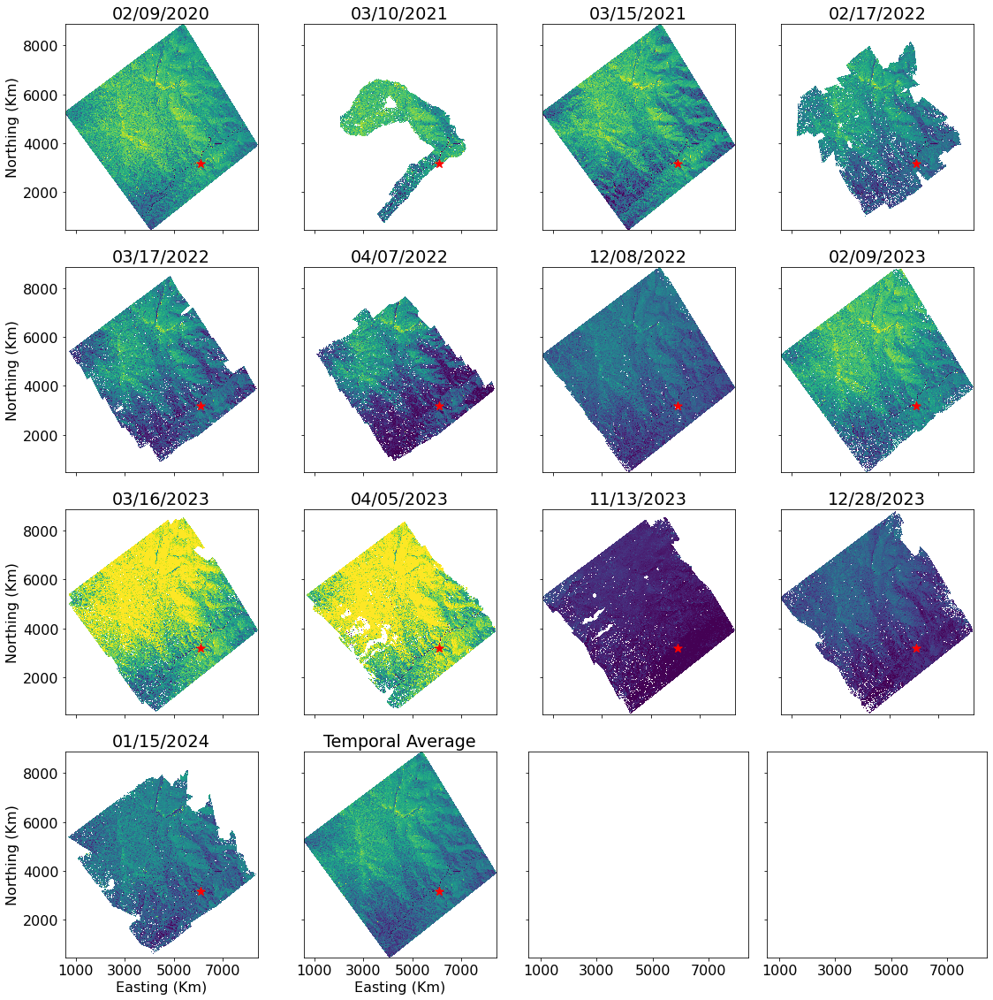

In [2]:
# gdf_20220217= gpd.read_file('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/new_bundary_20220217.gpkg')

# Add the temporal average to the files
sdf_ = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif']

Dates_ = ["02/09/2020", "03/10/2021","03/15/2021", "02/17/2022", "03/17/2022", "04/07/2022", "12/08/2022", "02/09/2023", "03/16/2023", "04/05/2023",'11/13/2023', '12/28/2023','01/15/2024', 'Temporal Average']

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16), sharex=True, sharey=True)

# Set minimum and maximum values for colormap  
vmin = 0
vmax = 3

for i, ax in enumerate(axes.flat):
    if i < len(sdf_):
        snow_depth = rxr.open_rasterio(sdf_[i], masked=True)
        im = snow_depth.plot(ax=ax, cmap='viridis', vmin=vmin, vmax=vmax, add_colorbar=False, robust=True)
        # gdf_20220217.plot(ax=ax, color='none', edgecolor='red')
        ax.scatter(607084.3493239387, 4865185.334007569, marker='*', s=100, color="red", label='SNOTEL')
        ax.set_title(Dates_[i])
        ax.set_aspect('equal')
        ax.set_xlabel('Easting (Km)')
        ax.set_ylabel('Northing (Km)')
        ax.label_outer()  # Hides the labels of the shared axes
        # Format x and y-axis labels to subtract leading digits
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
        ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
        


plt.tight_layout()
plt.show()

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


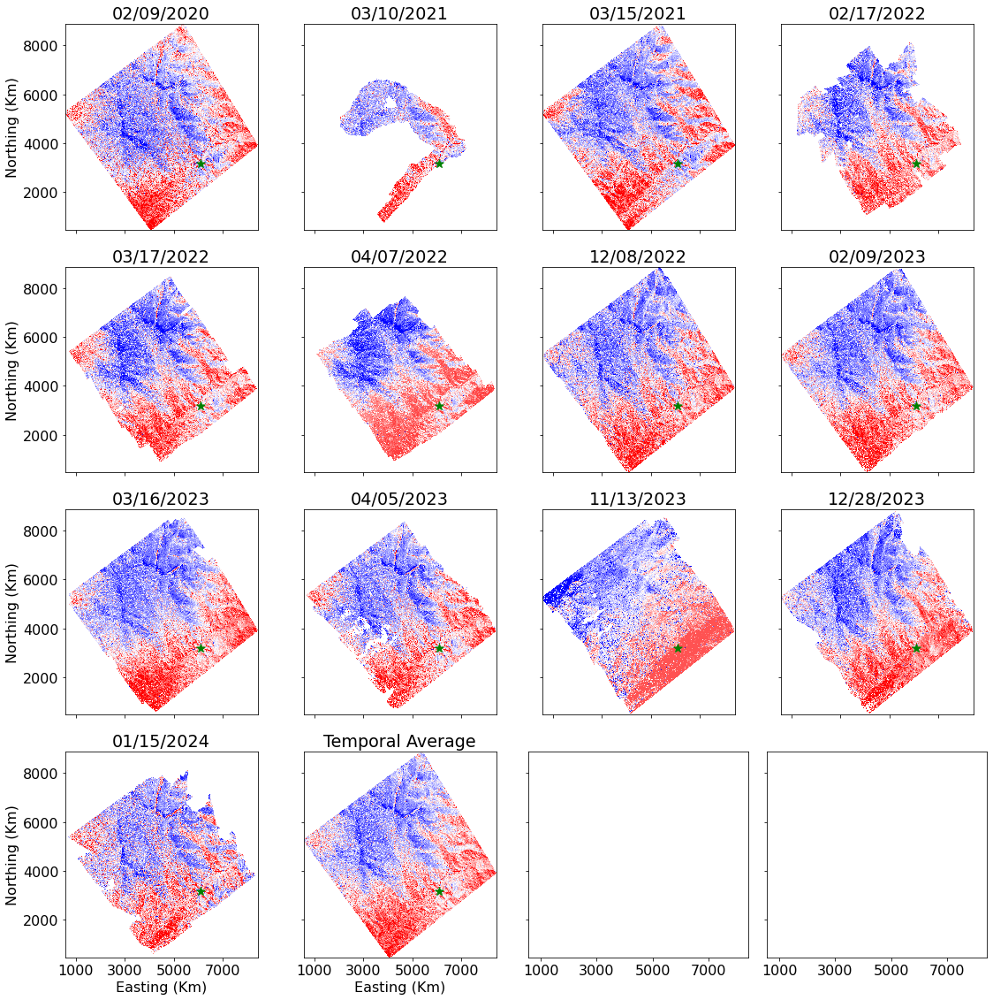

In [2]:
# gdf_20220217= gpd.read_file('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/new_bundary_20220217.gpkg')

# Add the temporal average to the files
sdf_ = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20240115_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif']

Dates_ = ["02/09/2020", "03/10/2021","03/15/2021", "02/17/2022", "03/17/2022", "04/07/2022", "12/08/2022", "02/09/2023", "03/16/2023", "04/05/2023",'11/13/2023', '12/28/2023','01/15/2024', 'Temporal Average']

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16), sharex=True, sharey=True)



for i, ax in enumerate(axes.flat):
    if i < len(sdf_):
        snow_depth = rxr.open_rasterio(sdf_[i], masked=True)
        im = snow_depth.plot(ax=ax, cmap='bwr_r', vmin=-2, vmax=2, add_colorbar=False, robust=True)
        # gdf_20220217.plot(ax=ax, color='none', edgecolor='red')
        ax.scatter(607084.3493239387, 4865185.334007569, marker='*', s=100, color="green", label='SNOTEL')
        ax.set_title(Dates_[i])
        ax.set_aspect('equal')
        ax.set_xlabel('Easting (Km)')
        ax.set_ylabel('Northing (Km)')
        ax.label_outer()  # Hides the labels of the shared axes
        # Format x and y-axis labels to subtract leading digits
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
        ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
        


plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 12), sharex=True, sharey=True)

for i, ax in enumerate(axes.flat):
    if i < len(sdv_files):
        sdv = rxr.open_rasterio(sdv_files[i], masked=True)
        im = sdv.plot(ax=ax, cmap='bwr_r', vmin=-2, vmax=2, add_colorbar=False, robust=True)
        ax.scatter(607084.3493239387, 4865185.334007569, marker='*', s=100, color="green", label='SNOTEL')
        ax.set_title(Dates[i])
        ax.set_aspect('equal')
        ax.set_xlabel('Easting (Km)')
        ax.set_ylabel('Northing (Km)')
        ax.label_outer()  # Hides the labels of the shared axes
        # Format x and y-axis labels to subtract leading digits
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
        ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
        


plt.tight_layout()
plt.show()

## Compare LiDAR mean to the SNOTEL.



In [214]:
sd_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/lidar-snowdepth/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
            '/SNOWDATA/IDALS/2021/20210310_MCS/ice-road/20210310_MCS-snowdepth.tif',
            '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/lidar-snowdepth/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
            '/SNOWDATA/IDALS/2022/20220217_MCS/ice-road/20220217_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2022/20220317_MCS/ice-road/20220317_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2022/20220407_MCS/ice-road/20220407_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20221208_MCS/ice-road/20221208_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20230209_MCS_v2/ice-road/20230209_MCS_v2-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/20230316_MCS/ice-road/20230316_MCS-snowdepth.tif',
            '/SNOWDATA/IDALS/2023/hanover_reprocess_20230405/ice-road/hanover_reprocess-snowdepth.tif',
            '/SNOWDATA/IDALS/2024/20231113/20231113_MCS/ice-road/AntHeightCorrected-snowdepth.tif',
            '/SNOWDATA/IDALS/2024/20231228/20231228_MCS_v2/ice-road/20231228_MCS_v2-snowdepth.tif',
            '/SNOWDATA/IDALS/2024/20240115/20240115_MCS/ice-road/20240115_MCS-snowdepth.tif']

sdf_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth.tif']

#create the dates of LiDAR flights to compare SNOTEL to
Dates = ["2020-02-09", "2021-03-10","2021-03-15", "2022-02-17", "2022-03-17", "2022-04-07", "2022-12-08", 
         "2023-02-09", "2023-03-16", "2023-04-05", "2023-11-13", "2023-12-28", "2024-01-15"]

#create a dataframe from the Dates list in yyyy-mm-dd format
df = pd.DataFrame(Dates, columns=['Date'])
df['Date'] = pd.to_datetime(df['Date'])
df['Date'] = df['Date'].dt.strftime('%Y-%m-%d')
df.set_index('Date', inplace=True) #set the index to the date column


df

""
Date
2020-02-09
2021-03-10
2021-03-15
2022-02-17
2022-03-17
2022-04-07
2022-12-08
2023-02-09
2023-03-16


In [2]:
def snotel_lidar_compare(stationID, sd_list = [], start_year = 2020, end_year = 2024):
    import matplotlib.dates as mdates
    snotel_point = SnotelPointData(stationID, "MyStation")
    data = snotel_point.get_daily_data(datetime(start_year -1, 10, 1), datetime(end_year, 9, 30),
                                    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
    data['SNOWDEPTH (m)'] = data['SNOWDEPTH'] * 0.0254 #convert to meters
    data['Date (MM-DD)'] = data.index.strftime('%m-%d') #add a new column (Date (MM-DD)) to the dataframe
    data.index = data.index.strftime('%Y-%m-%d') #convert the datetime index to YYYY-MM-DD

    #merge the snotel data with the dates dataframe
    snotel_vals = df.merge(data, left_index=True, right_index=True, how='left')
    snotel_vals.index = pd.to_datetime(snotel_vals.index)

    # # Create a figure
    fig, ax = plt.subplots(figsize=(15, 8))
    #create a dictionary to map the year to a color
    colors = {2020: 'blue', 2021: 'orange', 2022: 'green', 2023: 'red', 2024: 'purple'}
    #plot the data for each year in a different color : Use water year so year starts from October to September
    for i in range(start_year-1, end_year):
        record = data[str(i) + '-10-01':str(i+1) + '-09-30']
        record.index = pd.to_datetime(record.index)
        record.index = record.index.strftime('%m-%d') #convert the datetime index to MM-DD so I can plot all the years
        ax.plot(record.index, record['SNOWDEPTH (m)'], label = i+1, color=colors[i+1], alpha=0.7)
    
    #let's do 3 decades average
    data_DDD = snotel_point.get_daily_data(datetime(1993, 10, 1), datetime(2023, 9, 30),
                                           [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
    data_DDD['SNOWDEPTH (m)'] = data_DDD['SNOWDEPTH'] * 0.0254 #convert to meters
    data_DDD.reset_index(inplace=True)
    data_DDD['datetime'] = pd.to_datetime(data_DDD['datetime'])
    data_DDD['day_of_year'] = data_DDD['datetime'].dt.dayofyear #add a new column (day_of_year) to the dataframe
    data_DDD['year'] = data_DDD['datetime'].dt.year #add a new column (year) to the dataframe
    daily_avg_snowdepth = data_DDD.groupby('day_of_year')['SNOWDEPTH (m)'].mean() #calculate the daily average snowdepth
    daily_avg_snowdepth = daily_avg_snowdepth.reset_index() #reset the index
    daily_avg_snowdepth['MM-DD'] = pd.to_datetime(daily_avg_snowdepth['day_of_year'], format='%j').dt.strftime('%m-%d') #add a new column (MM-DD) to the dataframe
    daily_avg_snowdepth.set_index('MM-DD', inplace=True) #set the index to the YYYY-MM-DD column
    #remove the last two rows (There is repetition of 01:01)
    daily_avg_snowdepth = daily_avg_snowdepth[:-2]
    #break the dataframe to two. Onw with records starting from 10-01 to 12-31 and the other from 01-01 to 09-30. Then combine them
    daily_avg_snowdepth1 = daily_avg_snowdepth['10-01':'12-31']
    daily_avg_snowdepth2 = daily_avg_snowdepth['01-01':'09-30']
    daily_avg_snowdepth = pd.concat([daily_avg_snowdepth1, daily_avg_snowdepth2])
    ax.plot(daily_avg_snowdepth.index, daily_avg_snowdepth['SNOWDEPTH (m)'], label='30 years average', linestyle='dashed', color='black')

    #calculate LiDAR mean and std
    lidar_mean = []
    lidar_std = []

    for sd, date in zip(sd_list, Dates):
        sd = rxr.open_rasterio(sd, masked = True)     
        #plot the LiDAR mean and std
        date_yy = date.split('-')[0]
        date_mm = date.split('-')[1]
        #if the mm greater than 9 then it is next year
        if int(date_mm) > 9:
            date_yy = str(int(date_yy) + 1)
        date_mm_dd = date.split('-')[1:3]
        date_mm_dd = '-'.join(date_mm_dd)
        ax.errorbar(x= date_mm_dd, y=sd.mean(), yerr=sd.std(), marker='_', markersize =  15, capsize=5, color = colors[int(date_yy)])       
        lidar_mean.append(round(sd.mean().item(), 2))
        lidar_std.append(round(sd.std().item(), 2))

    #add the lidar mean and std to the snotel dataframe
    snotel_vals['LiDAR Mean (m)'] = lidar_mean
    snotel_vals['LiDAR Std (m)'] = lidar_std

    #find the difference between the snotel and lidar
    snotel_vals['Mean Difference (m)'] = snotel_vals['SNOWDEPTH (m)'] - snotel_vals['LiDAR Mean (m)']


    # Create major ticks for the first day of each month and minor ticks for the middle (day 15) of each month
    major_ticks = daily_avg_snowdepth.reset_index()['MM-DD'][daily_avg_snowdepth.reset_index()['MM-DD'].str.endswith('-01')]
    minor_ticks = daily_avg_snowdepth.reset_index()['MM-DD'][daily_avg_snowdepth.reset_index()['MM-DD'].str.endswith('-15')]
    # Define a dictionary to map month numbers to their abbreviated names
    month_map = {
        '10': 'Oct',
        '11': 'Nov',
        '12': 'Dec',
        '01': 'Jan',
        '02': 'Feb',
        '03': 'Mar',
        '04': 'Apr',
        '05': 'May',
        '06': 'Jun',
        '07': 'Jul',
        '08': 'Aug',
        '09': 'Sep'
    }

    # Create a new label format for the x-axis
    new_labels = [month_map[date.split('-')[0]] + '-' + date.split('-')[1] for date in major_ticks]


    # Set the major and minor ticks for the x-axis
    plt.xticks(major_ticks, new_labels)
    plt.gca().set_xticks(minor_ticks, minor=True)

    # Display grid for both major and minor ticks
    plt.grid(which='both')
    plt.grid(which='minor', alpha=0.2)

    #set the xlimt
    ax.set_xlim('10-01', '07-30')

    # Add a legend
    ax.legend()

    #set axis label
    ax.set_ylabel('Snow Depth (m)')
    ax.set_xlabel('Date')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=(6, 5), constrained_layout=True)
    ax = sns.regplot(x=snotel_vals["SNOWDEPTH (m)"], y=snotel_vals['LiDAR Mean (m)'], fit_reg= False)
    # ax.errorbar(snotel_vals["SNOWDEPTH (m)"], snotel_vals['LiDAR Mean (m)'], yerr=snotel_vals['LiDAR Std (m)'], fmt='none', capsize=7, zorder=1)
    #add a 1:1 line from 0 to max of lidar_mean list
    ax.plot([0, max(lidar_mean) + 0.5], [0, max(lidar_mean) + 0.5], color='black', linestyle='--', zorder=2)


    # Calculate correlation (r) and RMSE
    corr = np.corrcoef(snotel_vals["SNOWDEPTH (m)"], snotel_vals['LiDAR Mean (m)'])[0, 1]
    correlation_text = f'r: {corr:.2f}'
    rmse = np.sqrt(mean_squared_error(snotel_vals["SNOWDEPTH (m)"], snotel_vals['LiDAR Mean (m)']))
    rmse_text = f'RMSE: {rmse:.2f}'
    mbe = np.mean(snotel_vals["SNOWDEPTH (m)"] - snotel_vals['LiDAR Mean (m)'])
    mbe_text = f'MBE: {mbe:.2f}'
    mae = np.mean(np.abs(snotel_vals["SNOWDEPTH (m)"] - snotel_vals['LiDAR Mean (m)']))
    mae_text = f'MAE: {mae:.2f}'
    nmad = 1.4826 * np.median(np.abs(snotel_vals["SNOWDEPTH (m)"] - snotel_vals['LiDAR Mean (m)']))
    nmad_text = f'NMAD: {nmad:.2f}'

    # Add the correlation coefficient and RMSE as text to the upper left corner
    combined_text = '\n'.join([correlation_text, rmse_text, mbe_text, mae_text, nmad_text])
    ax.text(0.02, 0.98, combined_text, transform=ax.transAxes, color='black', bbox=dict(facecolor='white', alpha=0.8), ha='left', va='top')
    ax.set_xlabel('SNOTEL depth (m)')
    ax.set_ylabel('Mean Lidar depth (m)')
    plt.show()



    return data, snotel_vals, daily_avg_snowdepth

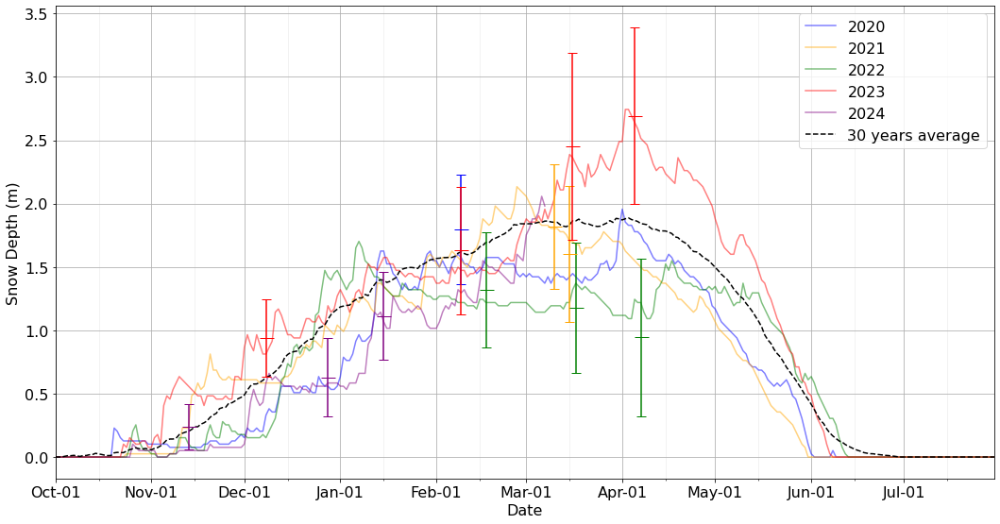

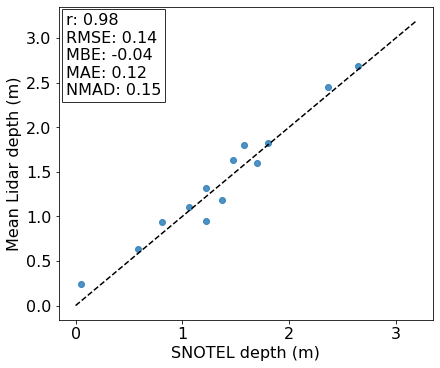

In [233]:
#Jackson SNOTEL
data, sv, ddd = snotel_lidar_compare("550:ID:SNTL", sdf_files)

## Two years for Shad

In [5]:
# sd_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/lidar-snowdepth/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
#             '/SNOWDATA/IDALS/2021/20210310_MCS/ice-road/20210310_MCS-snowdepth.tif',
#             '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/lidar-snowdepth/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
#             '/SNOWDATA/IDALS/2022/20220217_MCS/ice-road/20220217_MCS-snowdepth.tif',
#             '/SNOWDATA/IDALS/2022/20220317_MCS/ice-road/20220317_MCS-snowdepth.tif',
#             '/SNOWDATA/IDALS/2022/20220407_MCS/ice-road/20220407_MCS-snowdepth.tif',
#             '/SNOWDATA/IDALS/2023/20221208_MCS/ice-road/20221208_MCS-snowdepth.tif',
#             '/SNOWDATA/IDALS/2023/20230209_MCS_v2/ice-road/20230209_MCS_v2-snowdepth.tif',
#             '/SNOWDATA/IDALS/2023/20230316_MCS/ice-road/20230316_MCS-snowdepth.tif',
#             '/SNOWDATA/IDALS/2023/hanover_reprocess_20230405/ice-road/hanover_reprocess-snowdepth.tif',
#             '/SNOWDATA/IDALS/2024/20231113/20231113_MCS/ice-road/AntHeightCorrected-snowdepth.tif',
#             '/SNOWDATA/IDALS/2024/20231228/20231228_MCS_v2/ice-road/20231228_MCS_v2-snowdepth.tif',
#             '/SNOWDATA/IDALS/2024/20240115/20240115_MCS/ice-road/20240115_MCS-snowdepth.tif']

sdf_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth.tif']

#create the dates of LiDAR flights to compare SNOTEL to
Dates = [ "2022-12-08", "2023-02-09", "2023-03-16", "2023-04-05", "2023-11-13", "2023-12-28", "2024-01-15"]

#create a dataframe from the Dates list in yyyy-mm-dd format
df = pd.DataFrame(Dates, columns=['Date'])
df['Date'] = pd.to_datetime(df['Date'])
df['Date'] = df['Date'].dt.strftime('%Y-%m-%d')
df.set_index('Date', inplace=True) #set the index to the date column


df

""
Date
2022-12-08
2023-02-09
2023-03-16
2023-04-05
2023-11-13
2023-12-28
2024-01-15


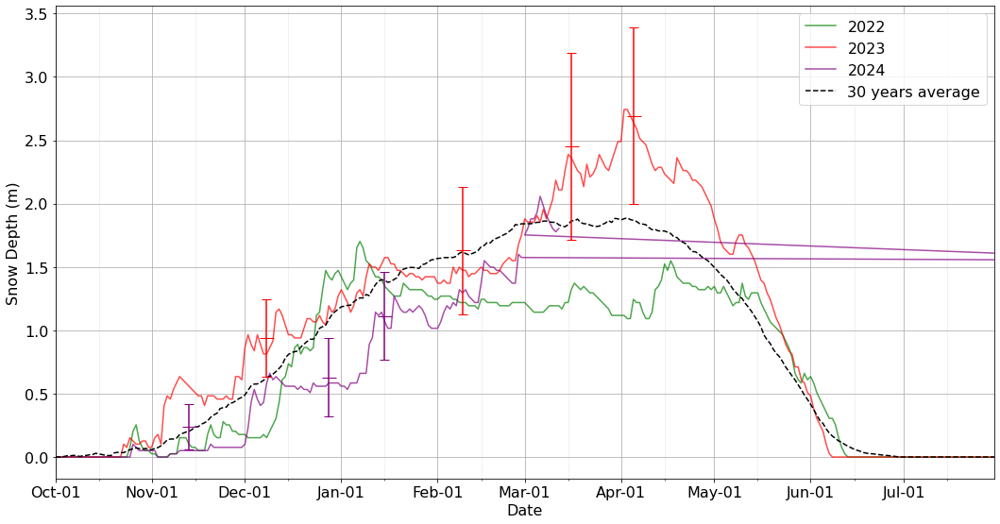

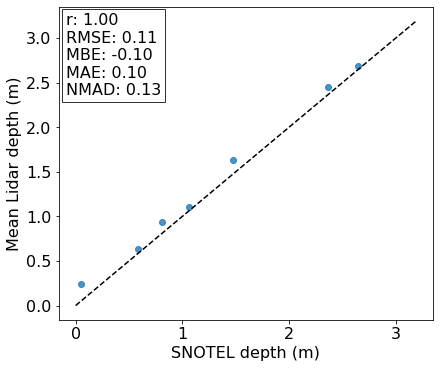

In [20]:
data, sv, ddd = snotel_lidar_compare("550:ID:SNTL", sdf_files, start_year = 2022, end_year = 2024)

In [21]:
data.tail(20)

,site,geometry,SNOWDEPTH,SNOWDEPTH_units,datasource,SNOWDEPTH (m),Date (MM-DD)
datetime,,,,,,,
2024-02-22,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),57.0,in,NRCS,1.4478,02-22
2024-02-23,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),56.0,in,NRCS,1.4224,02-23
2024-02-24,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),55.0,in,NRCS,1.3970,02-24
2024-02-25,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),54.0,in,NRCS,1.3716,02-25
2024-02-26,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),54.0,in,NRCS,1.3716,02-26
2024-02-27,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),63.0,in,NRCS,1.6002,02-27
2024-02-28,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),62.0,in,NRCS,1.5748,02-28
2024-02-29,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),61.0,in,NRCS,1.5494,02-29
2024-03-01,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),69.0,in,NRCS,1.7526,03-01


In [17]:
data.to_csv('/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/topo_features_del/snote_2yrs_del.csv')

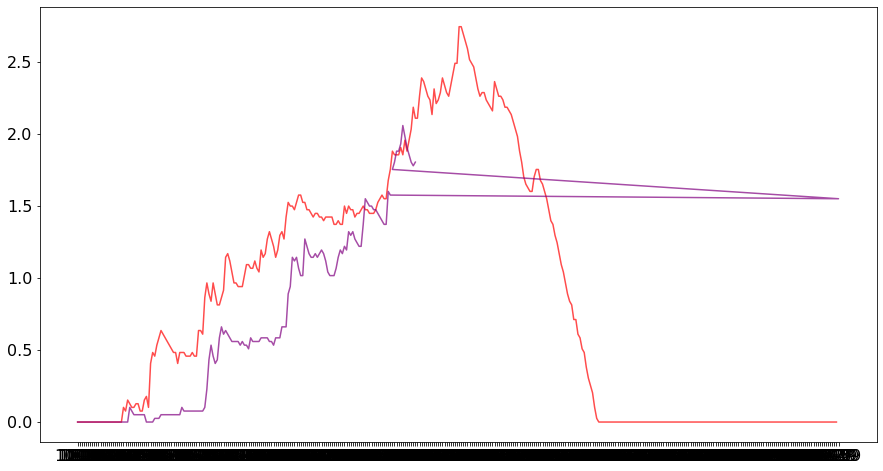

In [22]:
fig, ax = plt.subplots(figsize=(15, 8))
colors = {2020: 'blue', 2021: 'orange', 2022: 'green', 2023: 'red', 2024: 'purple'}
for i in range(2023-1, 2024):
    record = data[str(i) + '-10-01':str(i+1) + '-09-30']
    record.index = pd.to_datetime(record.index)
    record.index = record.index.strftime('%m-%d') #convert the datetime index to MM-DD so I can plot all the years
    record.to_csv('/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/topo_features_del/snote_2yrs_del_rec.csv')
    ax.plot(record.index, record['SNOWDEPTH (m)'], label = i+1, color=colors[i+1], alpha=0.7)


<AxesSubplot:xlabel='datetime'>

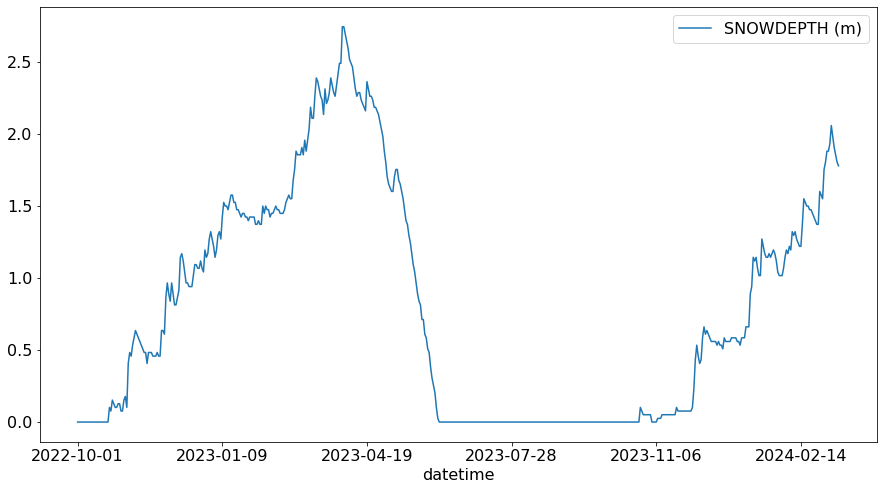

In [13]:
data.plot(y='SNOWDEPTH (m)', kind='line', figsize=(15, 8))

In [12]:
data.tail(50)

,site,geometry,SNOWDEPTH,SNOWDEPTH_units,datasource,SNOWDEPTH (m),Date (MM-DD)
datetime,,,,,,,
2024-01-22,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),45.0,in,NRCS,1.1430,01-22
2024-01-23,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),46.0,in,NRCS,1.1684,01-23
2024-01-24,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),45.0,in,NRCS,1.1430,01-24
2024-01-25,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),46.0,in,NRCS,1.1684,01-25
2024-01-26,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),47.0,in,NRCS,1.1938,01-26
2024-01-27,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),46.0,in,NRCS,1.1684,01-27
2024-01-28,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),44.0,in,NRCS,1.1176,01-28
2024-01-29,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),41.0,in,NRCS,1.0414,01-29
2024-01-30,550:ID:SNTL,POINT Z (-115.44322 44.05092 7070.00000),40.0,in,NRCS,1.0160,01-30


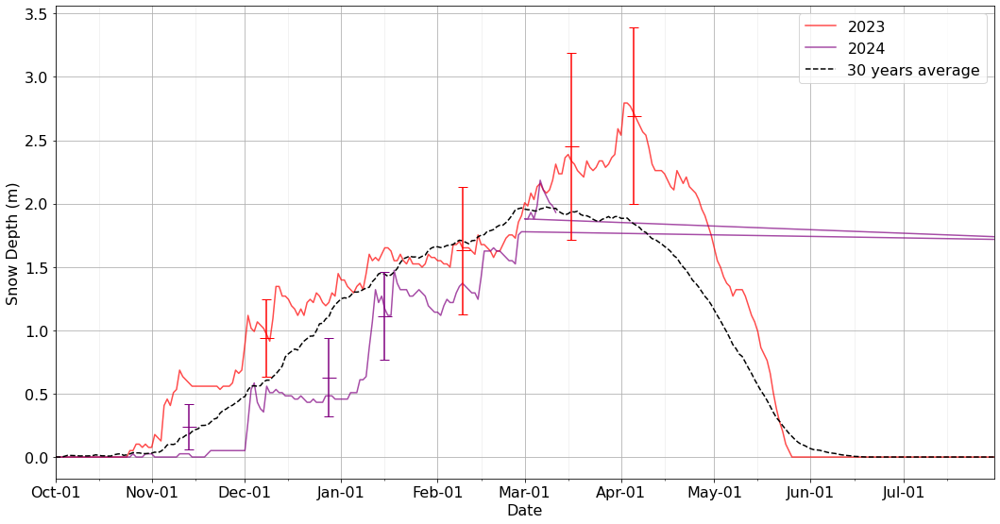

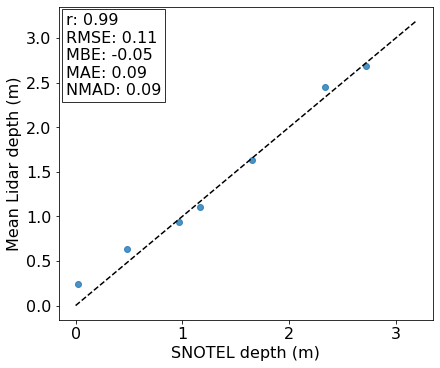

In [7]:
# MCS for the two years
data1, sv1, ddd1 = snotel_lidar_compare("637:ID:SNTL", sdf_files, start_year = 2023, end_year = 2024)

## Continue

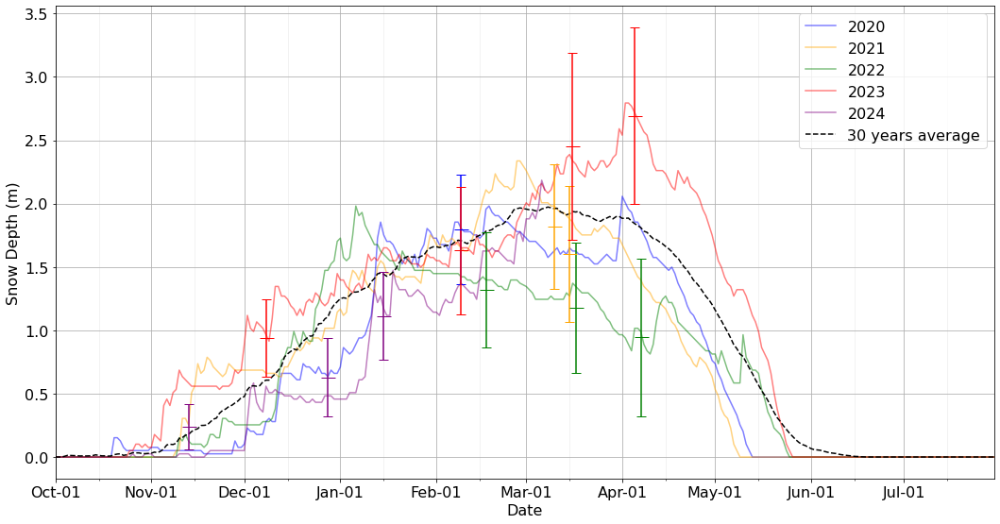

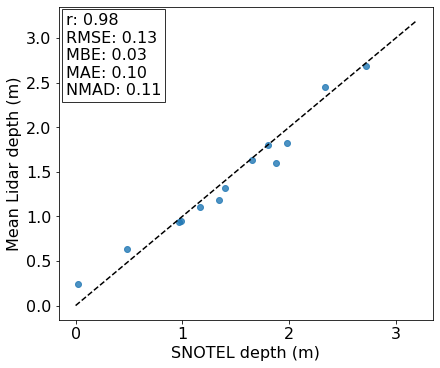

In [234]:
#MCS SNOTEL
data1, sv1, ddd1 = snotel_lidar_compare("637:ID:SNTL", sdf_files)

In [221]:
sv.describe()

,SNOWDEPTH,SNOWDEPTH (m),LiDAR Mean (m),LiDAR Std (m),Mean Difference (m)
count,13.000000,13.000000,13.000000,13.000000,13.000000
mean,54.153846,1.375508,1.412308,0.472308,-0.036800
std,27.269782,0.692652,0.688321,0.160060,0.145392
min,2.000000,0.050800,0.240000,0.180000,-0.225200
25%,42.000000,1.066800,0.950000,0.350000,-0.127200
50%,54.000000,1.371600,1.320000,0.490000,-0.048400
75%,67.000000,1.701800,1.800000,0.540000,-0.016600
max,104.000000,2.641600,2.690000,0.740000,0.269200


In [222]:
sv2.describe()

,SNOWDEPTH,SNOWDEPTH (m),LiDAR Mean (m),LiDAR Std (m),Mean Difference (m)
count,13.000000,13.000000,13.000000,13.000000,13.000000
mean,56.769231,1.441938,1.412308,0.472308,0.029631
std,29.040643,0.737632,0.688321,0.160060,0.133483
min,1.000000,0.025400,0.240000,0.180000,-0.214600
25%,39.000000,0.990600,0.950000,0.350000,0.003400
50%,55.000000,1.397000,1.320000,0.490000,0.027800
75%,74.000000,1.879600,1.800000,0.540000,0.077000
max,107.000000,2.717800,2.690000,0.740000,0.279600


In [20]:
snotel_point = SnotelPointData("637:ID:SNTL", "MyStation")
df_2020 = snotel_point.get_daily_data(
    datetime(2019, 10, 1), datetime(2020, 5, 31),
    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
df_2020['SNOWDEPTH (m)'] = df_2020['SNOWDEPTH'] * 0.0254

df_2021 = snotel_point.get_daily_data(
    datetime(2020, 10, 1), datetime(2021, 5, 31),
    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
df_2021['SNOWDEPTH (m)'] = df_2021['SNOWDEPTH'] * 0.0254

df_2022 = snotel_point.get_daily_data(
    datetime(2021, 10, 1), datetime(2022, 5, 31),
    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
df_2022['SNOWDEPTH (m)'] = df_2022['SNOWDEPTH'] * 0.0254

df_2023 = snotel_point.get_daily_data(
    datetime(2022, 10, 1), datetime(2023, 5, 31),
    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
df_2023['SNOWDEPTH (m)'] = df_2023['SNOWDEPTH'] * 0.0254

df_2024 = snotel_point.get_daily_data(
    datetime(2023, 10, 1), datetime(2024, 5, 31),
    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
df_2024['SNOWDEPTH (m)'] = df_2024['SNOWDEPTH'] * 0.0254

In [155]:
all_snotel = pd.concat([df_2020, df_2021, df_2022, df_2023, df_2024], axis = 0)
# convert datetime index to YYYY-MM-DD format
all_snotel.index = all_snotel.index.strftime('%Y-%m-%d')
all_snotel

,site,geometry,SNOWDEPTH,SNOWDEPTH_units,datasource,SNOWDEPTH (m)
datetime,,,,,,
2019-10-01,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),0.0,in,NRCS,0.0000
2019-10-02,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),0.0,in,NRCS,0.0000
2019-10-03,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),0.0,in,NRCS,0.0000
2019-10-04,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),0.0,in,NRCS,0.0000
2019-10-05,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),0.0,in,NRCS,0.0000
...,...,...,...,...,...,...
2024-01-29,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),47.0,in,NRCS,1.1938
2024-01-30,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),46.0,in,NRCS,1.1684
2024-01-31,637:ID:SNTL,POINT Z (-115.66588 43.93200 6100.00000),45.0,in,NRCS,1.1430


In [156]:
#Create dates of LiDAR flight to subset all snotels
Dates = ["02/09/2020", "03/10/2021","03/15/2021", "02/17/2022", "03/17/2022", "04/07/2022", "12/08/2022", 
         "02/09/2023", "03/16/2023", "04-05-2023", "11-13-2023", "12-28-2023", "01-15-2024"]
# Convert the date strings to datetime objects
date_objs = pd.to_datetime(Dates)

# Create the DataFrame with the datetime index
df = pd.DataFrame({'datetime': date_objs, 'index': range(len(date_objs))})
df = df.set_index('datetime')
df.index = df.index.strftime('%Y-%m-%d')
snotel_vals = df.join(all_snotel['SNOWDEPTH (m)'], how='left')

#sample LiDAR mean and std
lid_mean = []
lid_std = []
lidf_mean = []
lidf_std = []
for sd, sd_f in zip(sd_files, sdf_files):
    sd = rxr.open_rasterio(sd, masked = True)
    sd_f = rxr.open_rasterio(sd_f, masked = True)
    lid_mean.append(round(sd.mean().item(), 3))
    lid_std.append(round(sd.std().item(), 3))
    lidf_mean.append(round(sd_f.mean().item(), 3)) 
    lidf_std.append(round(sd_f.std().item(), 3))
    
snotel_vals['mean'] = lid_mean 
snotel_vals['std'] = lid_std
snotel_vals['mean_f'] = lidf_mean 
snotel_vals['std_f'] = lidf_std
snotel_vals['diff'] = snotel_vals['SNOWDEPTH (m)'] - snotel_vals['mean']
snotel_vals['diff_f'] = snotel_vals['SNOWDEPTH (m)'] - snotel_vals['mean_f']
# Convert the index to datetime and create a new 'Date' column
snotel_vals.index = pd.to_datetime(snotel_vals.index)
snotel_vals['Date'] = snotel_vals.index.strftime('%m-%d')
snotel_vals

,index,SNOWDEPTH (m),mean,std,mean_f,std_f,diff,diff_f,Date
datetime,,,,,,,,,
2020-02-09,0,1.8034,1.797,0.433,1.797,0.430,0.0064,0.0064,02-09
2021-03-10,1,1.9812,1.820,0.496,1.820,0.493,0.1612,0.1612,03-10
2021-03-15,2,1.8796,1.603,0.544,1.603,0.537,0.2766,0.2766,03-15
2022-02-17,3,1.3970,1.319,0.459,1.319,0.455,0.0780,0.0780,02-17
2022-03-17,4,1.3462,1.179,0.518,1.180,0.514,0.1672,0.1662,03-17
2022-04-07,5,0.9906,0.941,0.632,0.945,0.622,0.0496,0.0456,04-07
2022-12-08,6,0.9652,0.940,0.315,0.941,0.307,0.0252,0.0242,12-08
2023-02-09,7,1.6510,1.630,0.506,1.630,0.504,0.0210,0.0210,02-09
2023-03-16,8,2.3368,2.454,0.739,2.454,0.737,-0.1172,-0.1172,03-16


In [197]:
snotel_vals.describe()

,index,SNOWDEPTH (m),mean,std,mean_f,std_f,diff,diff_f
count,13.00000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000
mean,6.00000,1.441938,1.411846,0.493769,1.412769,0.471846,0.030092,0.029169
std,3.89444,0.737632,0.692747,0.173889,0.689307,0.160165,0.131440,0.133347
min,0.00000,0.025400,0.223000,0.219000,0.240000,0.177000,-0.197600,-0.214600
25%,3.00000,0.990600,0.941000,0.356000,0.945000,0.349000,0.006400,0.006400
50%,6.00000,1.397000,1.319000,0.496000,1.319000,0.493000,0.025200,0.024800
75%,9.00000,1.879600,1.797000,0.544000,1.797000,0.537000,0.078000,0.078000
max,12.00000,2.717800,2.700000,0.852000,2.693000,0.737000,0.276600,0.276600


In [157]:
#Need to convert the datetime to m-d format since I want to plot all years on a figure
df_2020.index = df_2020.index.strftime('%m-%d')
df_2021.index = df_2021.index.strftime('%m-%d')
df_2022.index = df_2022.index.strftime('%m-%d')
df_2023.index = df_2023.index.strftime('%m-%d')
df_2024.index = df_2024.index.strftime('%m-%d')

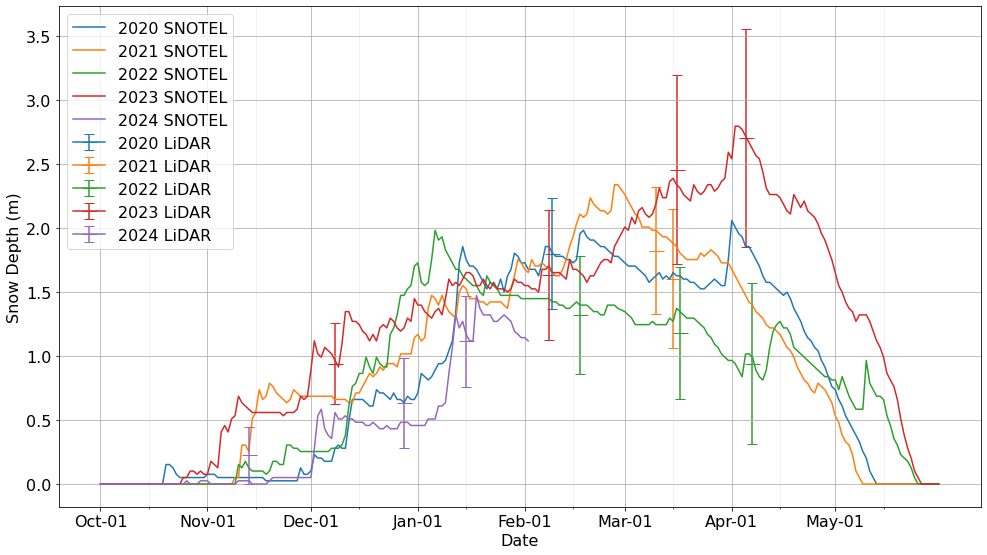

In [182]:
# Create a figure
fig, ax = plt.subplots(figsize=(14, 8))

# Plot the data for each year in a separate subplot
line_2020, = ax.plot(df_2020.index, df_2020['SNOWDEPTH (m)'], label='2020 SNOTEL')
line_2021, = ax.plot(df_2021.index, df_2021['SNOWDEPTH (m)'], label='2021 SNOTEL')
line_2022, = ax.plot(df_2022.index, df_2022['SNOWDEPTH (m)'], label='2022 SNOTEL')
line_2023, = ax.plot(df_2023.index, df_2023['SNOWDEPTH (m)'], label='2023 SNOTEL')
line_2024, = ax.plot(df_2024.index, df_2024['SNOWDEPTH (m)'], label='2024 SNOTEL')
# line_DDD, = ax.plot(df_DDD.index, df_DDD['yearly_average'], label='30 years average', linestyle='dashed', color='black')

# 2020 LiDAR mean value
ax.errorbar(x=snotel_vals.loc['2020-02-09', 'Date'], y=snotel_vals.loc['2020-02-09', 'mean'], yerr=snotel_vals.loc['2020-02-09', 'std'], marker='_', markersize =  15, capsize=5, color=line_2020.get_color(), label='2020 LiDAR')

# # 2021
ax.errorbar(x=snotel_vals.loc['2021-03-10', 'Date'], y=snotel_vals.loc['2021-03-10', 'mean'], yerr=snotel_vals.loc['2021-03-10', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2021.get_color(), label='2021 LiDAR')
ax.errorbar(x=snotel_vals.loc['2021-03-15', 'Date'], y=snotel_vals.loc['2021-03-15', 'mean'], yerr=snotel_vals.loc['2021-03-15', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2021.get_color())

# # 2022
ax.errorbar(x=snotel_vals.loc['2022-02-17', 'Date'], y=snotel_vals.loc['2022-02-17', 'mean'], yerr=snotel_vals.loc['2022-02-17', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2022.get_color(), label='2022 LiDAR')
ax.errorbar(x=snotel_vals.loc['2022-03-17', 'Date'], y=snotel_vals.loc['2022-03-17', 'mean'], yerr=snotel_vals.loc['2022-03-17', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2022.get_color())
ax.errorbar(x=snotel_vals.loc['2022-04-07', 'Date'], y=snotel_vals.loc['2022-04-07', 'mean'], yerr=snotel_vals.loc['2022-04-07', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2022.get_color())

# # 2023
ax.errorbar(x=snotel_vals.loc['2022-12-08', 'Date'], y=snotel_vals.loc['2022-12-08', 'mean'], yerr=snotel_vals.loc['2022-12-08', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color(), label='2023 LiDAR')
ax.errorbar(x='02-08' , y=snotel_vals.loc['2023-02-09', 'mean'], yerr=snotel_vals.loc['2023-02-09', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color()) #shifted this a day to the left because it overlap with 2020-02-09
ax.errorbar(x=snotel_vals.loc['2023-03-16', 'Date'], y=snotel_vals.loc['2023-03-16', 'mean'], yerr=snotel_vals.loc['2023-03-16', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color())
ax.errorbar(x=snotel_vals.loc['2023-04-05', 'Date'], y=snotel_vals.loc['2023-04-05', 'mean'], yerr=snotel_vals.loc['2023-04-05', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color())

# # 2024
ax.errorbar(x=snotel_vals.loc['2023-11-13', 'Date'], y=snotel_vals.loc['2023-11-13', 'mean'], yerr=snotel_vals.loc['2023-11-13', 'std'], marker='_', markersize =  15, capsize=5, zorder=2, color=line_2024.get_color(), label='2024 LiDAR')
ax.errorbar(x=snotel_vals.loc['2023-12-28', 'Date'], y=snotel_vals.loc['2023-12-28', 'mean'], yerr=snotel_vals.loc['2023-12-28', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2024.get_color())
ax.errorbar(x=snotel_vals.loc['2024-01-15', 'Date'], y=snotel_vals.loc['2024-01-15', 'mean'], yerr=snotel_vals.loc['2024-01-15', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2024.get_color())

# Create major ticks for the first day of each month and minor ticks for the middle (day 15) of each month
major_ticks = df_2020.reset_index()['datetime'][df_2020.reset_index()['datetime'].str.endswith('-01')]
minor_ticks = df_2020.reset_index()['datetime'][df_2020.reset_index()['datetime'].str.endswith('-15')]

# Define a dictionary to map month numbers to their abbreviated names
month_map = {
    '10': 'Oct',
    '11': 'Nov',
    '12': 'Dec',
    '01': 'Jan',
    '02': 'Feb',
    '03': 'Mar',
    '04': 'Apr',
    '05': 'May'
}

# Create a new label format for the x-axis
new_labels = [month_map[date.split('-')[0]] + '-' + date.split('-')[1] for date in major_ticks]


# Set the major and minor ticks for the x-axis
plt.xticks(major_ticks, new_labels)
plt.gca().set_xticks(minor_ticks, minor=True)

# Display grid for both major and minor ticks
plt.grid(which='both')
plt.grid(which='minor', alpha=0.2)

# Add a legend
ax.legend()

#set axis label
ax.set_ylabel('Snow Depth (m)')
ax.set_xlabel('Date')
plt.tight_layout()
plt.show()



Let's add the 30 years average to the plot.

In [137]:
#Let's do 3 decades (30 years)

snotel_point = SnotelPointData("637:ID:SNTL", "MyStation")
df_DDD = snotel_point.get_daily_data(
    datetime(1993, 10, 1), datetime(2023, 5, 31),
    [snotel_point.ALLOWED_VARIABLES.SNOWDEPTH]).reset_index(level = [1])
df_DDD['SNOWDEPTH (m)'] = df_DDD['SNOWDEPTH'] * 0.0254
df_DDD.to_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/MCS_snotel_DDD.csv')

In [183]:
# Load the data from the CSV file
data = pd.read_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/MCS_snotel_DDD.csv')
# Convert the 'datetime' column to a datetime format
data['datetime'] = pd.to_datetime(data['datetime'])

# Extract day of the year and year from the datetime column
data['day_of_year'] = data['datetime'].dt.dayofyear
data['year'] = data['datetime'].dt.year

# Group by day_of_year and compute the average snow depth in meters for each day across all years
daily_avg_snowdepth = data.groupby('day_of_year')['SNOWDEPTH (m)'].mean()

# Adding the MM-DD column to the daily_avg_snowdepth dataframe
daily_avg_snowdepth = daily_avg_snowdepth.reset_index()
daily_avg_snowdepth['MM-DD'] = pd.to_datetime(daily_avg_snowdepth['day_of_year'], format='%j').dt.strftime('%m-%d')

In [189]:
# Merge daily average wiith df_2023 format to make the rows similar
df_DDD = df_2023.merge(daily_avg_snowdepth[['MM-DD', 'SNOWDEPTH (m)']], left_on='datetime', right_on='MM-DD', how='left')
df_DDD = df_DDD.rename(columns= {'MM-DD': 'datetime', 'SNOWDEPTH (m)_y' : 'yearly_average'})
df_DDD = df_DDD[['datetime', 'yearly_average']]
df_DDD.set_index('datetime', inplace = True)

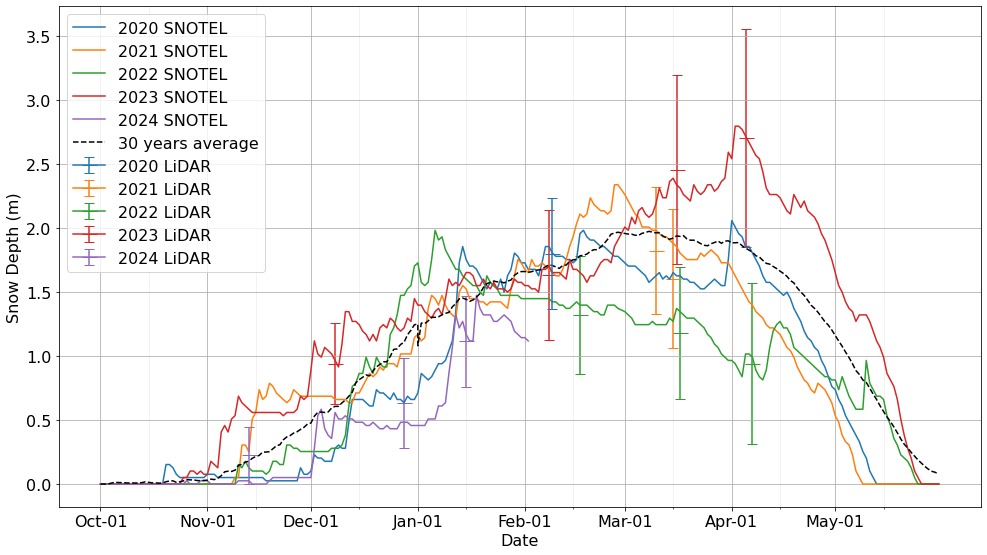

In [190]:
# Create a figure
fig, ax = plt.subplots(figsize=(14, 8))

# Plot the data for each year in a separate subplot
line_2020, = ax.plot(df_2020.index, df_2020['SNOWDEPTH (m)'], label='2020 SNOTEL')
line_2021, = ax.plot(df_2021.index, df_2021['SNOWDEPTH (m)'], label='2021 SNOTEL')
line_2022, = ax.plot(df_2022.index, df_2022['SNOWDEPTH (m)'], label='2022 SNOTEL')
line_2023, = ax.plot(df_2023.index, df_2023['SNOWDEPTH (m)'], label='2023 SNOTEL')
line_2024, = ax.plot(df_2024.index, df_2024['SNOWDEPTH (m)'], label='2024 SNOTEL')
line_DDD, = ax.plot(df_DDD.index, df_DDD['yearly_average'], label='30 years average', linestyle='dashed', color='black')

# 2020 LiDAR mean value
ax.errorbar(x=snotel_vals.loc['2020-02-09', 'Date'], y=snotel_vals.loc['2020-02-09', 'mean'], yerr=snotel_vals.loc['2020-02-09', 'std'], marker='_', markersize =  15, capsize=5, color=line_2020.get_color(), label='2020 LiDAR')

# # 2021
ax.errorbar(x=snotel_vals.loc['2021-03-10', 'Date'], y=snotel_vals.loc['2021-03-10', 'mean'], yerr=snotel_vals.loc['2021-03-10', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2021.get_color(), label='2021 LiDAR')
ax.errorbar(x=snotel_vals.loc['2021-03-15', 'Date'], y=snotel_vals.loc['2021-03-15', 'mean'], yerr=snotel_vals.loc['2021-03-15', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2021.get_color())

# # 2022
ax.errorbar(x=snotel_vals.loc['2022-02-17', 'Date'], y=snotel_vals.loc['2022-02-17', 'mean'], yerr=snotel_vals.loc['2022-02-17', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2022.get_color(), label='2022 LiDAR')
ax.errorbar(x=snotel_vals.loc['2022-03-17', 'Date'], y=snotel_vals.loc['2022-03-17', 'mean'], yerr=snotel_vals.loc['2022-03-17', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2022.get_color())
ax.errorbar(x=snotel_vals.loc['2022-04-07', 'Date'], y=snotel_vals.loc['2022-04-07', 'mean'], yerr=snotel_vals.loc['2022-04-07', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2022.get_color())

# # 2023
ax.errorbar(x=snotel_vals.loc['2022-12-08', 'Date'], y=snotel_vals.loc['2022-12-08', 'mean'], yerr=snotel_vals.loc['2022-12-08', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color(), label='2023 LiDAR')
ax.errorbar(x='02-08' , y=snotel_vals.loc['2023-02-09', 'mean'], yerr=snotel_vals.loc['2023-02-09', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color()) #shifted this a day to the left because it overlap with 2020-02-09
ax.errorbar(x=snotel_vals.loc['2023-03-16', 'Date'], y=snotel_vals.loc['2023-03-16', 'mean'], yerr=snotel_vals.loc['2023-03-16', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color())
ax.errorbar(x=snotel_vals.loc['2023-04-05', 'Date'], y=snotel_vals.loc['2023-04-05', 'mean'], yerr=snotel_vals.loc['2023-04-05', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2023.get_color())

# # 2024
ax.errorbar(x=snotel_vals.loc['2023-11-13', 'Date'], y=snotel_vals.loc['2023-11-13', 'mean'], yerr=snotel_vals.loc['2023-11-13', 'std'], marker='_', markersize =  15, capsize=5, zorder=2, color=line_2024.get_color(), label='2024 LiDAR')
ax.errorbar(x=snotel_vals.loc['2023-12-28', 'Date'], y=snotel_vals.loc['2023-12-28', 'mean'], yerr=snotel_vals.loc['2023-12-28', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2024.get_color())
ax.errorbar(x=snotel_vals.loc['2024-01-15', 'Date'], y=snotel_vals.loc['2024-01-15', 'mean'], yerr=snotel_vals.loc['2024-01-15', 'std'], marker='_', markersize =  15, capsize=5, zorder=1, color=line_2024.get_color())

# Create major ticks for the first day of each month and minor ticks for the middle (day 15) of each month
major_ticks = df_2020.reset_index()['datetime'][df_2020.reset_index()['datetime'].str.endswith('-01')]
minor_ticks = df_2020.reset_index()['datetime'][df_2020.reset_index()['datetime'].str.endswith('-15')]

# Define a dictionary to map month numbers to their abbreviated names
month_map = {
    '10': 'Oct',
    '11': 'Nov',
    '12': 'Dec',
    '01': 'Jan',
    '02': 'Feb',
    '03': 'Mar',
    '04': 'Apr',
    '05': 'May'
}

# Create a new label format for the x-axis
new_labels = [month_map[date.split('-')[0]] + '-' + date.split('-')[1] for date in major_ticks]


# Set the major and minor ticks for the x-axis
plt.xticks(major_ticks, new_labels)
plt.gca().set_xticks(minor_ticks, minor=True)

# Display grid for both major and minor ticks
plt.grid(which='both')
plt.grid(which='minor', alpha=0.2)

# Add a legend
ax.legend()

#set axis label
ax.set_ylabel('Snow Depth (m)')
ax.set_xlabel('Date')
plt.tight_layout()
plt.show()



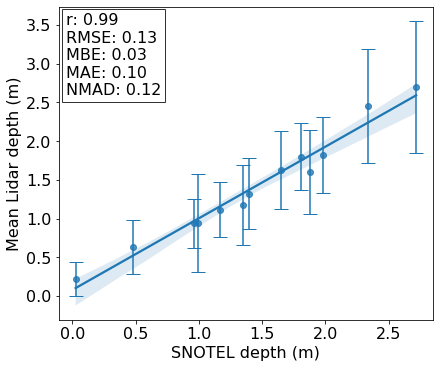

In [196]:
fig, ax = plt.subplots(figsize=(6, 5), constrained_layout=True)
ax = sns.regplot(x=snotel_vals["SNOWDEPTH (m)"], y=snotel_vals["mean"])
ax.errorbar(snotel_vals["SNOWDEPTH (m)"], snotel_vals["mean"], yerr=snotel_vals["std"], fmt='none', capsize=7, zorder=1, color='C0')
# Calculate correlation (r) and RMSE
corr = np.corrcoef(snotel_vals["SNOWDEPTH (m)"], snotel_vals["mean"])[0, 1]
correlation_text = f'r: {corr:.2f}'
rmse = np.sqrt(mean_squared_error(snotel_vals["SNOWDEPTH (m)"], snotel_vals["mean"]))
rmse_text = f'RMSE: {rmse:.2f}'
mbe = np.mean(snotel_vals["SNOWDEPTH (m)"] - snotel_vals["mean"])
mbe_text = f'MBE: {mbe:.2f}'
mae = np.mean(np.abs(snotel_vals["SNOWDEPTH (m)"] - snotel_vals["mean"]))
mae_text = f'MAE: {mae:.2f}'
nmad = 1.4826 * np.median(np.abs(snotel_vals["SNOWDEPTH (m)"] - snotel_vals["mean"]))
nmad_text = f'NMAD: {nmad:.2f}'

# Add the correlation coefficient and RMSE as text to the upper left corner
combined_text = '\n'.join([correlation_text, rmse_text, mbe_text, mae_text, nmad_text])
ax.text(0.02, 0.98, combined_text, transform=ax.transAxes, color='black', bbox=dict(facecolor='white', alpha=0.8), ha='left', va='top')
ax.set_xlabel('SNOTEL depth (m)')
ax.set_ylabel('Mean Lidar depth (m)')
plt.show()

## Repeatability of snow distribution pattern


In [215]:
#I added the temporally averaged sdv to the sdv raster list --> sdvt_files

sdvt_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/20240115_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif']

# Dict to store correlations  
corr_matrix = {}

for i, file1 in enumerate(sdvt_files):
    
    src1 = rasterio.open(file1)  
    r1 = src1.read()
    
    corr_matrix[os.path.basename(file1)] = {}
    
    for file2 in sdvt_files[i+1:]:
       
        src2 = rasterio.open(file2)
        r2 = src2.read()

        r1 = r1.flatten()
        r2 = r2.flatten()

        df = pd.DataFrame({'r1':r1, 'r2': r2})
        df = df.dropna()

        corr_coef = round(df['r1'].corr(df['r2']), 2)
        
        basename = os.path.basename(file2)
        corr_matrix[os.path.basename(file1)][basename] = corr_coef
        
# Convert dict to dataframe 
df = pd.DataFrame(corr_matrix)
df.to_csv('/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/sdv/pattern_repeatability.csv')
# Print correlations  
print(df)

                                            QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif  \
20210310_MCS-snowdepth.tif                                                        0.91   
QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif                                        0.86   
20220217_MCS-snowdepth.tif                                                        0.80   
20220317_MCS-snowdepth.tif                                                        0.81   
20220407_MCS-snowdepth.tif                                                        0.72   
20221208_MCS-snowdepth.tif                                                        0.80   
20230209_MCS_v2-snowdepth.tif                                                     0.84   
20230316_MCS-snowdepth.tif                                                        0.86   
hanover_reprocess-snowdepth.tif                                                   0.89   
AntHeightCorrected-snowdepth.tif                                                  0.24   
20231228_M

In [ ]:
# fig, ax = plt.subplots( figsize=(14, 12))
# im = sdf_average.plot(ax=ax, cmap='Spectral', robust = True, cbar_kwargs={'label': 'Temporal Mean Depth'})
# ax.set_title('')
# ax.set_aspect('equal')
# ax.set_xlabel('Easting (Km)')
# ax.set_ylabel('Northing (Km)')
# # Format x and y-axis labels to subtract leading digits
# ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
# ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
# plt.tight_layout()
# plt.show()

In [ ]:
# # Extract all the data in a csv
# extract_list = []
# for i in len(sd_files):
#     snow_depth = rxr.open_rasterio(sd_files[i], masked = True).values.flatten()
#     snow_depth_f = rxr.open_rasterio(sdf_files[i], masked = True).values.flatten()
#     sdv = rxr.open_rasterio(sdv_files[i], masked = True).values.flatten()
#     veg_path = "/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/vh.tif"
#     slope_path = "/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/slope.tif"
#     asp_path = "/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/aspect.tif"
#     elev = dem.values.flatten()
#     vh = rxr.open_rasterio(veg_path, masked = True).values.flatten()
#     slope = rxr.open_rasterio(slope_path, masked = True).values.flatten()
#     asp = rxr.open_rasterio(asp_path, masked = True).values.flatten()
#     # Create a DataFrame
#     data = {'date': Dates[i], 'snow depth': snow_depth,'snow depth filtered': snow_depth_f, 'sdv': sdv, 'elev': elev, 'vh': vh, 'slope': slope, 'aspect': asp}
#     data_df = pd.DataFrame(data)
#     extract_list.append(data_df)
#     # extract all data    
#     result_data = pd.concat(extract_list)
#     result_data.to_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/all_extract.csv')

## Snow Prediction

Mask all rasters to the 03/10/2021. This is for snow pattern duistribution training and testing

In [200]:
# Get reference file 
ref_path = sdf_files[1]

# Open reference raster
ref = rxr.open_rasterio(ref_path) 

# Get mask of NaN values  
ref_mask = ~np.isnan(ref)

# Loop through rasters
for fp in sdf_files:

  raster = rxr.open_rasterio(fp)
  
  # Apply mask
  masked = raster.where(ref_mask) 
  
  out_path = f"{os.path.splitext(fp)[0]}_masked.tif"
  masked.rio.to_raster(out_path)

In [201]:
sdfm_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20200209_20200209_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20210310_MCS-snowdepth_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20210315_20210315_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220217_MCS-snowdepth_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth_masked.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth_masked.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth_masked.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth_masked.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth_masked.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth_masked.tif']

In [203]:
sdv_raster = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif', masked = True)
sdv_values = sdv_raster.values.flatten()

for i in range(len(sdf_files)):
#let's read and flatten raster values
    sd_values =  rxr.open_rasterio(sdf_files[i], masked = True).values.flatten() #the snow depth raster
    sdm_values =  rxr.open_rasterio(sdfm_files[i], masked = True).values.flatten()# the snowdepth masked to the smallest valid rasters (03/10/2021)
    data = pd.DataFrame({'sdv': sdv_values, 'sd' : sd_values, 'sdm' : sdm_values})
    # Preparing the data for regression
    data_f = data.dropna()
    X = data_f['sdv'].values.reshape(-1, 1)  # Predictor variable
    y = data_f['sdm'].values  # Response variable

    # Performing linear regression
    regression_model = LinearRegression()
    regression_model.fit(X, y)

    # Extracting the slope (coefficient) and intercept
    slope = regression_model.coef_[0]
    intercept = regression_model.intercept_

    #predicting
    data['sd_predict'] = (data['sdv'] * slope) + intercept

    # train data assessment
    data_train = data[['sdm', 'sd_predict']].dropna()
    r_T = data['sdm'].corr(data['sd_predict'])
    rmse_T = np.sqrt(mean_squared_error(data_train['sdm'], data_train['sd_predict']))
    r_T, rmse_T

    # all data assessment
    data_all = data[['sd', 'sd_predict']].dropna()
    r = data_all['sd'].corr(data_all['sd_predict'])
    rmse = np.sqrt(mean_squared_error(data_all['sd'], data_all['sd_predict']))
    r, rmse

    print(f'{Dates[i]}: The r and rmse on train and all data are {round(r_T, 2), round(rmse_T, 2), round(r, 2), round(rmse, 2)}')

    # Convert sd column back to original raster shape
    sd_predict_raster = sdv.copy(data=data['sd_predict'].values.reshape(sdv.shape))
    path = sdf_files[i]
    filename_without_extension = os.path.splitext(os.path.basename(path))[0] # Get the filename without the extension
    new_filename = filename_without_extension + '_masked_predict.tif'  # Append "_masked_predict.tif" to the filename
    out_path = os.path.join(os.path.dirname(path), new_filename) # The new path with the modified filename
    # Write out raster
    sd_predict_raster.rio.to_raster(out_path)

02/09/2020: The r and rmse on train and all data are (0.91, 0.18, 0.88, 0.21)
03/10/2021: The r and rmse on train and all data are (0.93, 0.18, 0.93, 0.18)
03/15/2021: The r and rmse on train and all data are (0.93, 0.2, 0.9, 0.24)
02/17/2022: The r and rmse on train and all data are (0.97, 0.12, 0.96, 0.13)
03/17/2022: The r and rmse on train and all data are (0.97, 0.14, 0.95, 0.16)
04/07/2022: The r and rmse on train and all data are (0.91, 0.27, 0.91, 0.26)
12/08/2022: The r and rmse on train and all data are (0.95, 0.1, 0.95, 0.1)
02/09/2023: The r and rmse on train and all data are (0.98, 0.11, 0.97, 0.13)
03/16/2023: The r and rmse on train and all data are (0.97, 0.18, 0.96, 0.2)
04/05/2023: The r and rmse on train and all data are (0.96, 0.19, 0.95, 0.23)
12/28/2023: The r and rmse on train and all data are (0.54, 0.13, 0.49, 0.16)
11/13/2023: The r and rmse on train and all data are (0.93, 0.12, 0.91, 0.13)
01/15/2024: The r and rmse on train and all data are (0.9, 0.15, 0.86

Plot the predicted data

In [ ]:
sdfp_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20200209_20200209_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20210310_MCS-snowdepth_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20210315_20210315_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220217_MCS-snowdepth_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth_masked_predict.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth_masked_predict.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth_masked_predict.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth_masked_predict.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth_masked_predict.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth_masked_predict.tif']

## Predicting with the Distribution Pattern

Here I want to use few point measurement (at most 10) and the distribution pattern to predict snow depth. 

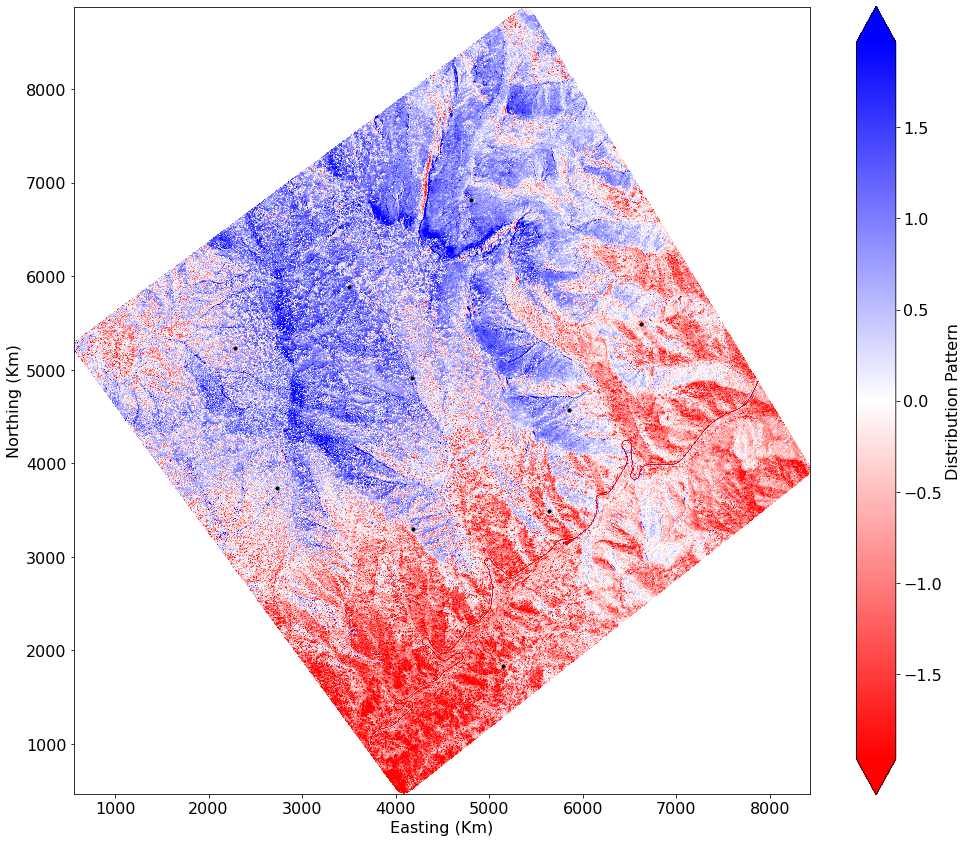

In [204]:
gdf = gpd.read_file('/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/Training_Points_10.gpkg')
sdv_raster = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif', masked = True)
fig, ax = plt.subplots( figsize=(14, 12))
im = sdv_raster.plot(ax=ax, cmap= 'bwr_r', robust = True, cbar_kwargs={'label': 'Distribution Pattern'})
gdf.plot(ax=ax, markersize=10, color='black')
ax.set_title('')
ax.set_aspect('equal')
ax.set_xlabel('Easting (Km)')
ax.set_ylabel('Northing (Km)')
# Format x and y-axis labels to subtract leading digits
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 4.862e6)}"))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f"{int(x - 601000)}"))
plt.tight_layout()
plt.show()

In [206]:

#read the sdv raster values
sdv_values = sdv_raster.values.flatten()
for i in range(len(sdf_files)):
    #sample the sdv and snow depth at 10 points
    snowDepth = rxr.open_rasterio(sdf_files[i])
    sdv = point_query(gdf.geometry, sdv_raster.squeeze().values, affine = snowDepth.rio.transform(), nodata = -9999)
    sd = point_query(gdf.geometry, snowDepth.squeeze().values, affine = snowDepth.rio.transform(), nodata = -9999)
    df = pd.DataFrame({'sdv': sdv, 'sd' : sd})
    # Preparing the data for regression
    df = df.dropna()
    num_records = len(df)
    X = df['sdv'].values.reshape(-1, 1)  # Predictor variable
    y = df['sd'].values  # Response variable

    # Performing linear regression
    regression_model = LinearRegression()
    regression_model.fit(X, y)

    # Extracting the slope (coefficient) and intercept
    slope = regression_model.coef_[0]
    intercept = regression_model.intercept_

    # sample sdv raster for easy prediction
    data = pd.DataFrame({'sdv': sdv_values})
    #predicting
    data['sd_predict'] = (data['sdv'] * slope) + intercept
    #get the truth data
    sd_values =  rxr.open_rasterio(sdf_files[i], masked = True).values.flatten() #the snow depth raster
    data['sd'] = sd_values
    # all data assessment
    data_all = data[['sd', 'sd_predict']].dropna()
    r = data_all['sd'].corr(data_all['sd_predict'])
    rmse = np.sqrt(mean_squared_error(data_all['sd'], data_all['sd_predict']))
    r, rmse

    print(f'{Dates[i]}: The r and rmse are { round(r,2), round(rmse,2)}. The data is trained with { len(df)} points')

    # Convert sd column back to original raster shape
    sd_predict_raster = sdv_raster.copy(data=data['sd_predict'].values.reshape(sdv_raster.shape))
    path = sdf_files[i]
    filename_without_extension = os.path.splitext(os.path.basename(path))[0] # Get the filename without the extension
    new_filename = filename_without_extension + '_10pts_predict.tif'  # Append "_10pts_predict.tif" to the filename
    new_path = os.path.join(os.path.dirname(path), new_filename) # The new path with the modified filename
    sd_predict_raster.rio.to_raster(new_path) # Write out raster

02/09/2020: The r and rmse are (0.88, 0.21). The data is trained with 10 points
03/10/2021: The r and rmse are (0.93, 0.21). The data is trained with 4 points
03/15/2021: The r and rmse are (0.9, 0.24). The data is trained with 10 points
02/17/2022: The r and rmse are (0.96, 0.16). The data is trained with 7 points
03/17/2022: The r and rmse are (0.95, 0.17). The data is trained with 10 points
04/07/2022: The r and rmse are (0.91, 0.27). The data is trained with 9 points
12/08/2022: The r and rmse are (0.95, 0.12). The data is trained with 10 points
02/09/2023: The r and rmse are (0.97, 0.13). The data is trained with 10 points
03/16/2023: The r and rmse are (0.96, 0.21). The data is trained with 9 points
04/05/2023: The r and rmse are (0.95, 0.29). The data is trained with 9 points
11/13/2023: The r and rmse are (0.49, 0.16). The data is trained with 8 points
12/28/2023: The r and rmse are (0.91, 0.16). The data is trained with 8 points
01/15/2024: The r and rmse are (0.86, 0.2). The 

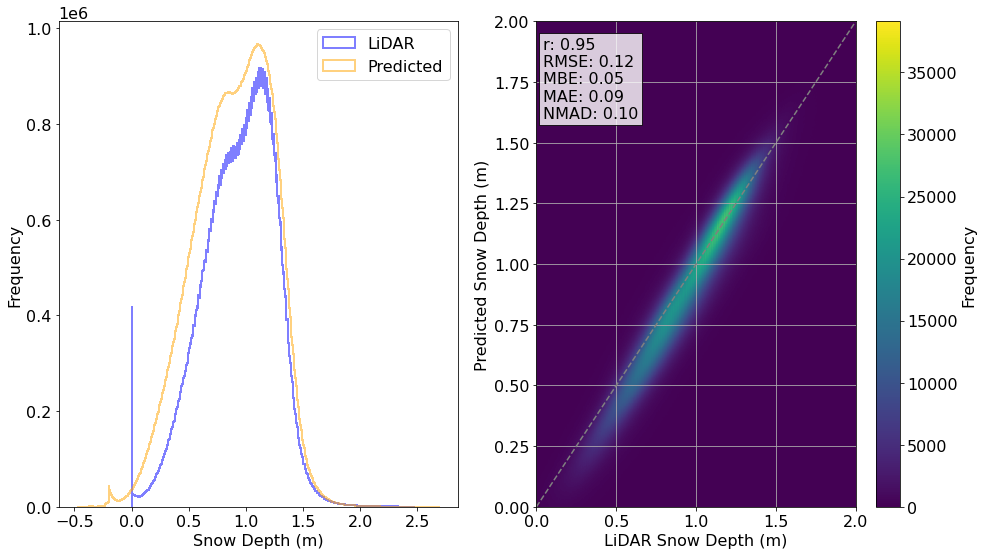

In [207]:
pred = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth_10pts_predict.tif')
Lid = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif')
LiD_values = Lid.values.flatten()
pred_values = pred.values.flatten()
valid_indices = ~np.isnan(LiD_values) & ~np.isnan(pred_values)
LiD_values = LiD_values[valid_indices]
pred_values = pred_values[valid_indices]
# Create a single figure with two subplots (histogram and heatmap)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 8))

# Plot histogram of LiDAR and predicted snow depth distributions
axes[0].hist(LiD_values, bins=500, color='blue', alpha=0.5, histtype='step', linewidth=2, label='LiDAR')
axes[0].hist(pred_values, bins=500, color='orange', alpha=0.5, histtype='step', linewidth=2, label='Predicted')
axes[0].set_xlabel('Snow Depth (m)')
axes[0].set_ylabel('Frequency')
axes[0].legend()

# Create a heatmap to compare LiDAR and predicted snow depth
heatmap, xedges, yedges = np.histogram2d(LiD_values, pred_values, bins=500)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
im = axes[1].imshow(heatmap.T, origin='lower', extent=extent, cmap='viridis', aspect='auto')

# Add a hypothetical one-to-one dashed line
axes[1].plot([0, 2], [0, 2], linestyle='--', color='gray')

# Calculate the correlation coefficient
correlation, _ = pearsonr(LiD_values, pred_values)
correlation_text = f'r: {correlation:.2f}'

# Calculate the Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(LiD_values, pred_values))
rmse_text = f'RMSE: {rmse:.2f}'

# Calculate MBE, MAE, and NMAD
mbe = np.mean(LiD_values - pred_values)
mbe_text = f'MBE: {mbe:.2f}'
mae = np.mean(np.abs(LiD_values - pred_values))
mae_text = f'MAE: {mae:.2f}'
nmad = 1.4826 * np.median(np.abs(LiD_values - pred_values))
nmad_text = f'NMAD: {nmad:.2f}'

# Add the correlation coefficient and RMSE as text to the upper left corner
combined_text = '\n'.join([correlation_text, rmse_text, mbe_text, mae_text, nmad_text])
axes[1].text(0.02, 0.80, combined_text, transform=axes[1].transAxes, color='black', bbox=dict(facecolor='white', alpha=0.8))

# Add colorbar to the heatmap
cbar = plt.colorbar(im, ax=axes[1], label='Frequency')
axes[1].set_xlabel('LiDAR Snow Depth (m)')
axes[1].set_ylabel('Predicted Snow Depth (m)')
axes[1].set_xlim(0, 2)
axes[1].set_ylim(0, 2)
axes[1].grid(True)

# Adjust layout and show the figure
plt.tight_layout()
plt.show()

Now, I want to predict for Feb 13 data before the processing is completed. 

In [6]:
sdv_raster = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif', masked = True)
sdv_values = sdv_raster.values.flatten()
# Read the CSV file into a DataFrame
df = pd.read_csv('/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324_5points.csv')

# Convert latitude and longitude to geometry column
from shapely.geometry import Point
geometry = [Point(xy) for xy in zip(df.Longitude, df.Latitude)]

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs = 'EPSG:4326')

#reproject to UTM
gdf = gdf.to_crs(sdv_raster.rio.crs)

#sample the sdv and snow depth at 5 points
sdv = point_query(gdf.geometry, sdv_raster.squeeze().values, affine = sdv_raster.rio.transform(), nodata = -9999)
sd = gdf['Depth'].values / 100 #convert to meters

# Create a DataFrame
df = pd.DataFrame({'sdv': sdv, 'sd' : sd})

# Preparing the data for regression
X = df['sdv'].values.reshape(-1, 1)  # Predictor variable
y = df['sd'].values  # Response variable

# Performing linear regression
regression_model = LinearRegression()
regression_model.fit(X, y)

# Extracting the slope (coefficient) and intercept
slope = regression_model.coef_[0]
intercept = regression_model.intercept_

# sample sdv raster for easy prediction
data = pd.DataFrame({'sdv': sdv_values})
#predicting
data['sd_predict'] = (data['sdv'] * slope) + intercept

# Convert sd column back to original raster shape
sd_predict_raster = sdv_raster.copy(data=data['sd_predict'].values.reshape(sdv_raster.shape))

sd_predict_raster.rio.to_raster('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240213_MCS_PROBE_5pts_predict.tif')

In [8]:
pointVal_20240213, roadpointVal_20240213 = lidar_val('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240213_MCS_PROBE_5pts_predict.tif', '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324.csv', 
          'Depth', 'Latitude', 'Longitude', use_buffer= 'Yes')

/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rasterstats/io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


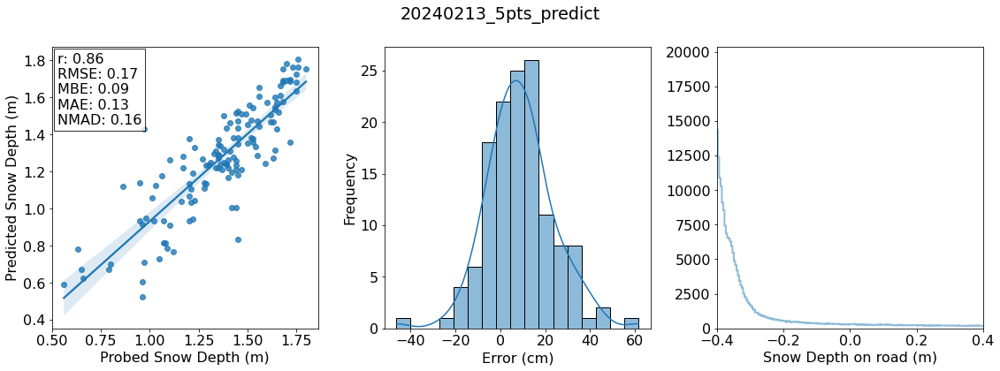

In [12]:
plot_val(pointVal_20240213, roadpointVal_20240213, '20240213_5pts_predict')

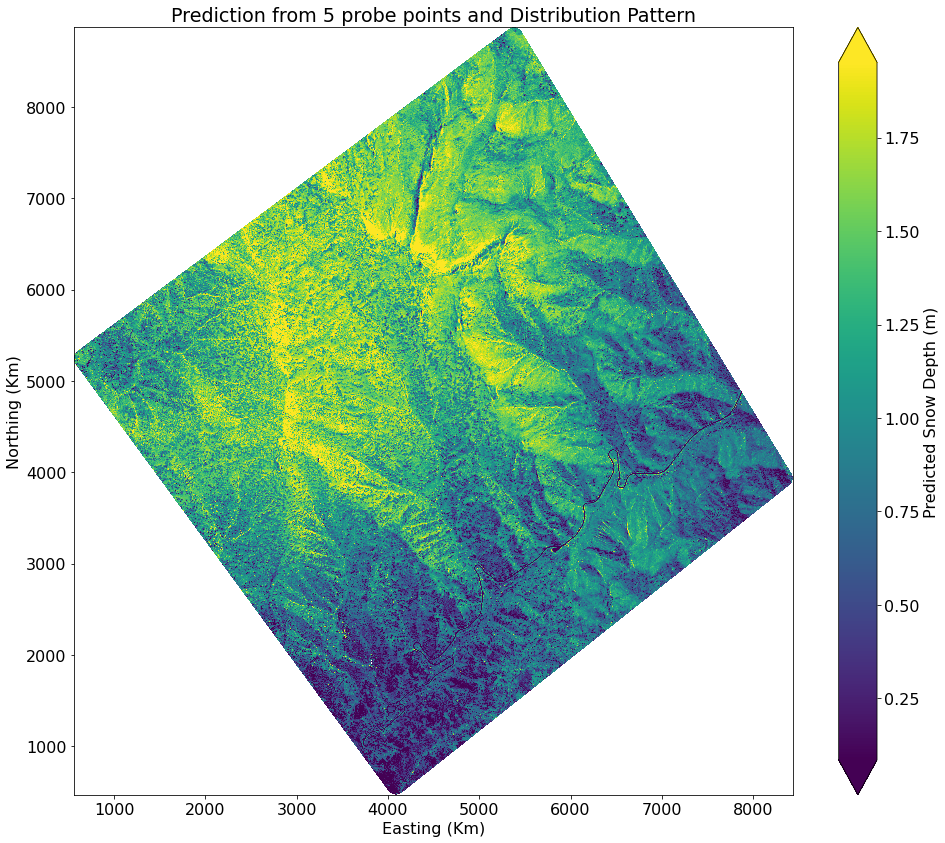

In [14]:
plot_raster('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240213_MCS_PROBE_5pts_predict.tif', cbar_label='Predicted Snow Depth (m)', title='Prediction from 5 probe points and Distribution Pattern') 

Let's test with upper elevation range

In [16]:
pointVal_20240213, roadpointVal_20240213 = lidar_val('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240213_MCS_PROBE_5pts_predict.tif', '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324upperElev.csv', 
          'Depth', 'Latitude', 'Longitude', use_buffer= 'Yes')

/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/rasterstats/io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


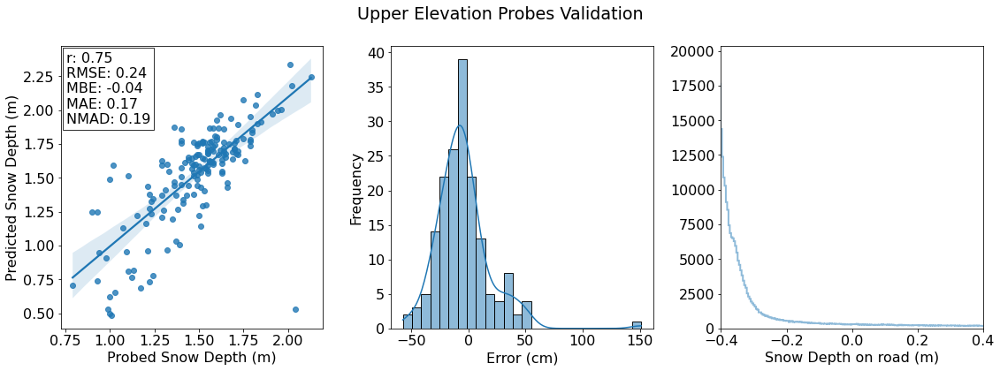

In [17]:
plot_val(pointVal_20240213, roadpointVal_20240213, 'Upper Elevation Probes Validation')

In [18]:
pointVal_20240213

,Latitude,Longitude,Probed Snow Depth (m),geometry,LiDAR Snow Depth (m),error (cm)
0,43.961539,-115.693763,1.79,POINT (604794.379 4868430.372),1.779294,1.070635
1,43.961529,-115.693783,1.69,POINT (604792.791 4868429.279),1.687888,0.211171
2,43.961512,-115.693799,1.72,POINT (604791.530 4868427.353),1.695218,2.478210
3,43.961490,-115.693803,1.57,POINT (604791.231 4868424.904),1.620538,-5.053821
4,43.961468,-115.693795,1.23,POINT (604791.921 4868422.423),1.328898,-9.889771
...,...,...,...,...,...,...
165,43.961494,-115.693812,1.61,POINT (604790.486 4868425.328),1.674007,-6.400742
166,43.961514,-115.693798,1.64,POINT (604791.639 4868427.509),1.695772,-5.577209
167,43.961549,-115.693798,1.52,POINT (604791.538 4868431.404),1.295412,22.458850
168,43.961564,-115.693789,1.38,POINT (604792.240 4868433.159),1.265577,11.442319


In [23]:
from sklearn.metrics import mean_squared_error, r2_score
from numpy.random import default_rng
from scipy.stats import iqr
from shapely.geometry import Point

def monte_carlo_simulation(raster_file, csv_file, lat_col = "Latitude", lon_col = "Longitude", n_simulations=100, n_points = 6, use_buffer = "no", depth_col = "Depth"):
    sdv_raster = rxr.open_rasterio(raster_file, masked = True)
    sdv_values = sdv_raster.values.flatten()
    # Initialize random number generator
    rng = default_rng()

    # Read the CSV file into a DataFrame
    probe_data = pd.read_csv(csv_file)

    # # Convert latitude and longitude to geometry column
    # geometry = [Point(xy) for xy in zip(probe_data[lon_col], probe_data[lat_col])]

    # Create a GeoDataFrame
    gdf = gpd.GeoDataFrame(probe_data, geometry= gpd.points_from_xy(probe_data[lon_col], probe_data[lat_col]), crs = 'EPSG:4326')

    #reproject to UTM
    gdf = gdf.to_crs(sdv_raster.rio.crs)
    
    #convert the Depth column to meters
    gdf[depth_col] = gdf[depth_col] / 100

    # Initialize lists to store results
    rmse_values = []
    r2_values = []
    bias_values = []

    # Do the simulation
    for _ in range(n_simulations):
        train_df = gdf.sample(n_points, random_state=rng.integers(0, high=10000))
        test_df = gdf.drop(train_df.index)

    # sample the sdv and snow depth at the train df (spare n points)
        sdv = point_query(train_df.geometry, sdv_raster.squeeze().values, affine = sdv_raster.rio.transform(), nodata = -9999)
        sd = train_df[depth_col]

        # Create a DataFrame
        df = pd.DataFrame({'sdv': sdv, 'sd' : sd})

        # Preparing the data for regression
        df = df.dropna()
        #continue if length of df is less than 3 (you need at least 2 points to get slope and intercept)
        if len(df) < 3:
            continue
        X = df['sdv'].values.reshape(-1, 1)
        y = df['sd'].values

        # Performing linear regression
        regression_model = LinearRegression()
        regression_model.fit(X, y)

        # Extracting the slope (coefficient) and intercept
        slope = regression_model.coef_[0]
        intercept = regression_model.intercept_

        # sample sdv raster for easy prediction
        data = pd.DataFrame({'sdv': sdv_values})
        
        #predicting
        data['sd_predict'] = (data['sdv'] * slope) + intercept
        
        # convert the predicted values to raster
        sd_predict_raster = sdv_raster.copy(data=data['sd_predict'].values.reshape(sdv_raster.shape))

        if use_buffer.lower() == "no":
            #Extract the predicted snow depth values at pixels where the test points are located
            sd_predict = point_query(test_df.geometry, sd_predict_raster.squeeze().values, affine = sd_predict_raster.rio.transform(), nodata = -9999)
            test_df['sd_predict'] = sd_predict
        else:
            # buffer the points
            test_df_buffered = test_df.buffer(2)
            # calculate zonal statistics of the mean within the buffer
            vals = zonal_stats(
                test_df_buffered,
                sd_predict_raster.squeeze().values,
                affine=sd_predict_raster.rio.transform(),
                nodata=-9999,
                stats="mean",
            )
            # Extract the mean values and add to the dataframe
            test_df['sd_predict'] = [val['mean'] for val in vals]
            
        # Calculate statistics
        rmse = np.sqrt(mean_squared_error(test_df[depth_col], test_df['sd_predict']))
        r2 = r2_score(test_df[depth_col], test_df['sd_predict'])
        bias = np.mean(test_df[depth_col] - test_df['sd_predict'])

        # Append to the lists
        rmse_values.append(rmse)
        r2_values.append(r2)
        bias_values.append(bias)

    # Calculate median and IQR for each statistic
    rmse_median, rmse_iqr = np.median(rmse_values), iqr(rmse_values)
    r2_median, r2_iqr = np.median(r2_values), iqr(r2_values)
    bias_median, bias_iqr = np.median(bias_values), iqr(bias_values)

    # Plot the results
    fig, axes = plt.subplots(3, 1, figsize=(10, 12))
    sns.histplot(rmse_values, kde=True, ax=axes[0])
    axes[0].set_title("")
    axes[0].set_xlabel("RMSE (m)")
    #Indicate the mean, median and IQR on the plot
    axes[0].axvline(rmse_median, color='red', linestyle='--', label=f'Median ({rmse_median:.2f})')
    axes[0].axvline(rmse_median - rmse_iqr/2, color='green', linestyle='--', label=f'IQR ({rmse_iqr:.2f})')
    axes[0].axvline(rmse_median + rmse_iqr/2, color='green', linestyle='--')
    axes[0].legend()

    sns.histplot(r2_values, kde=True, ax=axes[1])
    axes[1].set_title("")
    axes[1].set_xlabel("R^2")
    #Indicate the mean, median and IQR on the plot
    axes[1].axvline(r2_median, color='red', linestyle='--', label=f'Median ({r2_median:.2f})')
    axes[1].axvline(r2_median - r2_iqr/2, color='green', linestyle='--', label=f'IQR ({r2_iqr:.2f})')
    axes[1].axvline(r2_median + r2_iqr/2, color='green', linestyle='--')
    axes[1].legend()

    sns.histplot(bias_values, kde=True, ax=axes[2])
    axes[2].set_title("Bias")
    axes[2].set_xlabel("Bias (m)")
    #Indicate the mean, median and IQR on the plot
    axes[2].axvline(bias_median, color='red', linestyle='--', label=f'Median ({bias_median:.2f})')
    axes[2].axvline(bias_median - bias_iqr/2, color='green', linestyle='--', label=f'IQR ({bias_iqr:.2f})')
    axes[2].axvline(bias_median + bias_iqr/2, color='green', linestyle='--')
    axes[2].legend()
    
    plt.tight_layout()

    print(f'RMSE: median={rmse_median}, IQR={rmse_iqr}')
    print(f'R^2: median={r2_median}, IQR={r2_iqr}')
    print(f'Bias: median={bias_median}, IQR={bias_iqr}')

    return rmse_values, r2_values, bias_values



RMSE: median=0.1582296835178, IQR=0.03502761296944687
R^2: median=0.6494394221454464, IQR=0.14585297522847962
Bias: median=0.0006013629865141696, IQR=0.08812131060096182


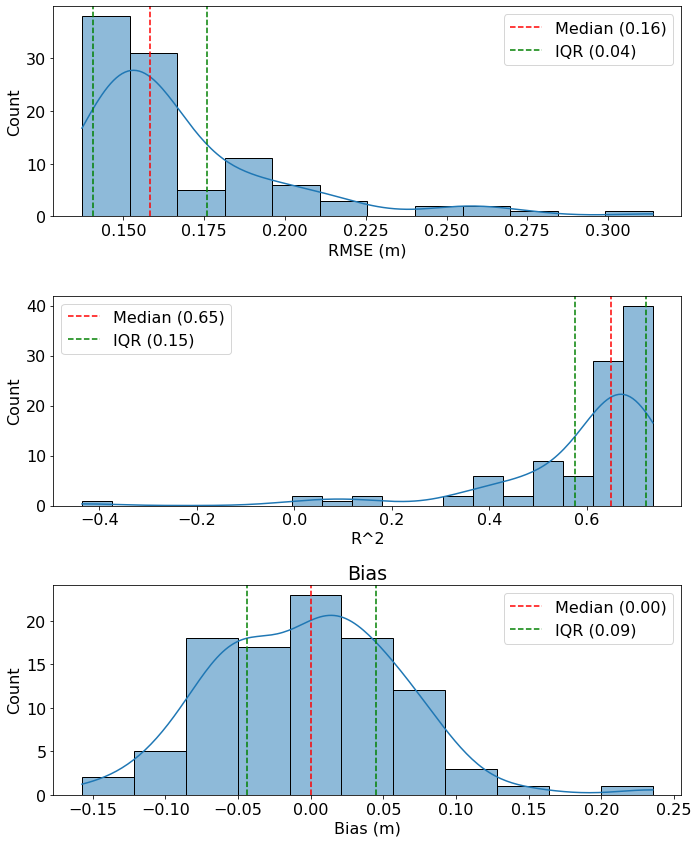

In [24]:
rmse, r2, bias = monte_carlo_simulation('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif',
                       '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324.csv')

RMSE: median=0.14973249137003927, IQR=0.011544285455938358
R^2: median=0.6884116952713659, IQR=0.05037022307527517
Bias: median=-0.000489149219789259, IQR=0.060375629411703796


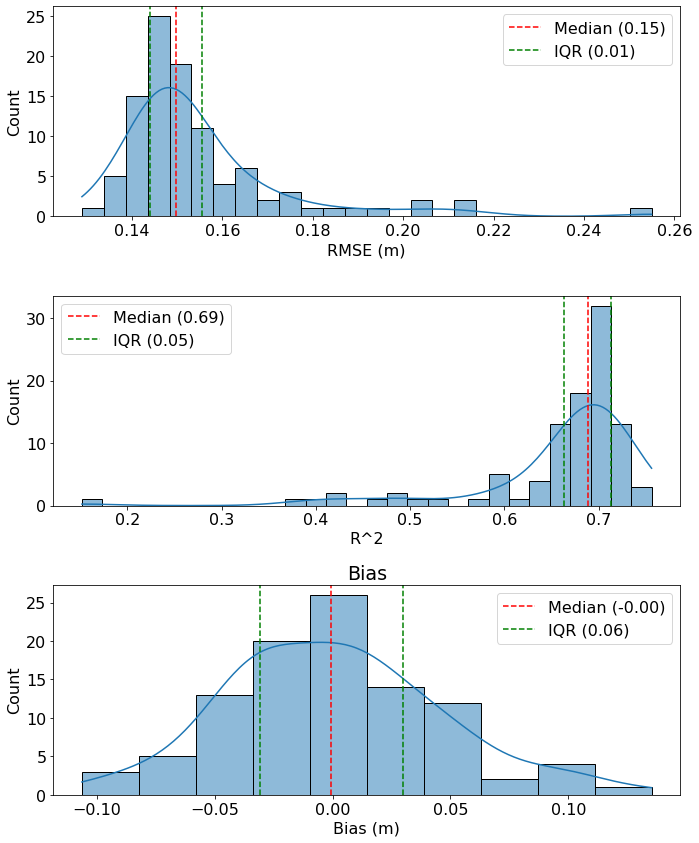

In [25]:
rmse, r2, bias = monte_carlo_simulation('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif',
                       '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324.csv', n_points= 12)

RMSE: median=0.14722921393338456, IQR=0.011586615891105934
R^2: median=0.6996089442160336, IQR=0.049583844539446975
Bias: median=-0.00448267365151674, IQR=0.05570212373220673


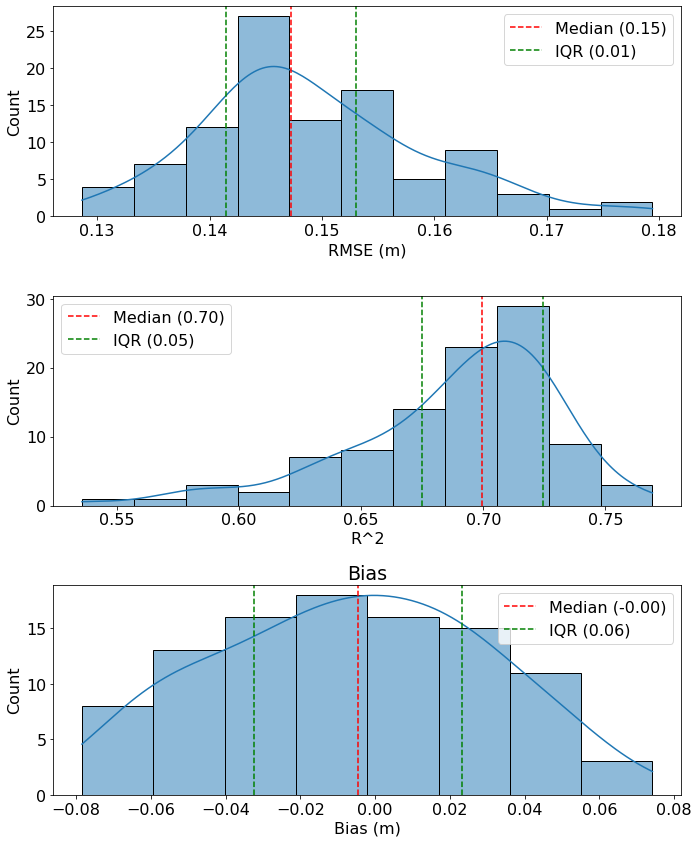

In [26]:
rmse, r2, bias = monte_carlo_simulation('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif',
                       '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324.csv', n_points= 18)

RMSE: median=0.1450280723279665, IQR=0.008068535744786942
R^2: median=0.7041147910675387, IQR=0.0473237957479834
Bias: median=-0.0012174859221101664, IQR=0.03557687801625506


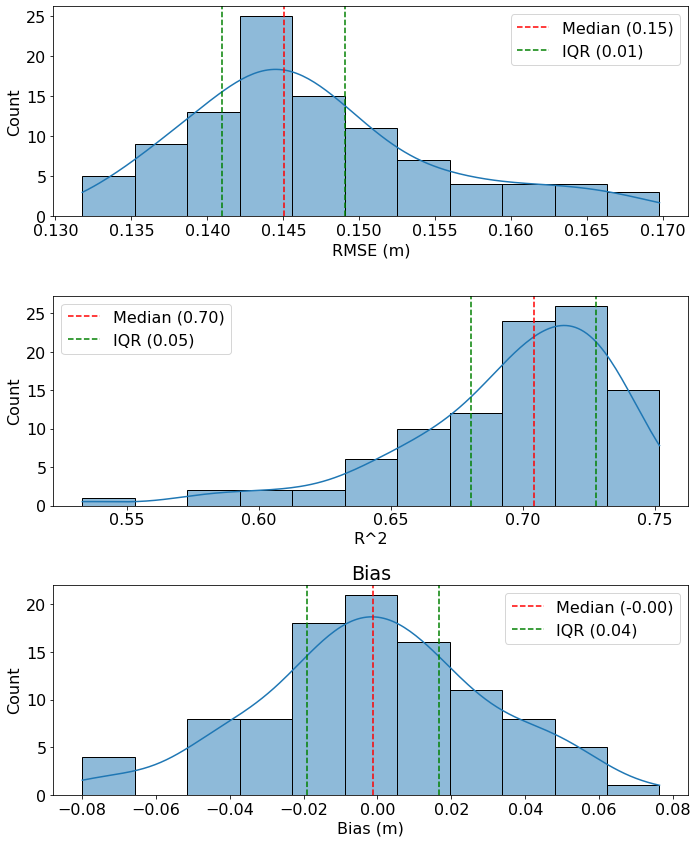

In [27]:
rmse, r2, bias = monte_carlo_simulation('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif',
                       '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324.csv', n_points= 24)

RMSE: median=0.1450356620846023, IQR=0.008540744306636067
R^2: median=0.7074166287384827, IQR=0.037127728854063013
Bias: median=0.0031932662783017178, IQR=0.0409771289372712


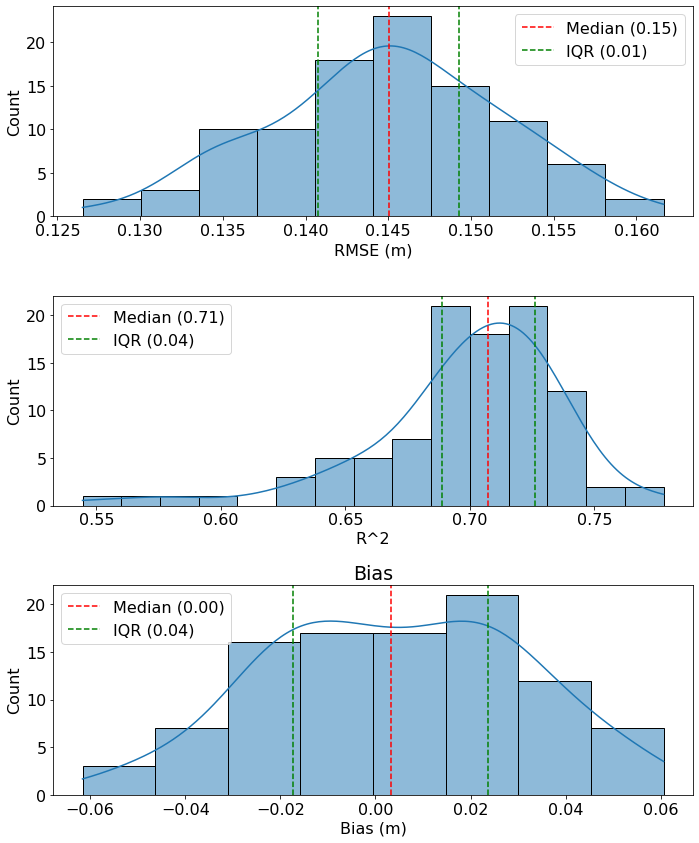

In [28]:
rmse, r2, bias = monte_carlo_simulation('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif',
                       '/SNOWDATA/IDALS/2024/20240213/20240213_MCS_PROBE/MCS021324.csv', n_points= 32)

## Topo Controls on Snow Distribution



In [31]:
#open and flatten the snow depth and topo features
elev = rxr.open_rasterio('/SNOWDATA/IDALS/misc_data_scripts/dem.tif', masked = True).values.flatten()
vh = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/vh.tif", masked = True).values.flatten()
slope = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/slope.tif", masked = True).values.flatten()
asp = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/aspect.tif", masked = True).values.flatten()
sdf = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif', masked = True).values.flatten()
sdv = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/sdv/sdv_average.tif', masked = True).values.flatten()

In [34]:
print(len(elev))
print(len(vh))
print(len(slope))
print(len(asp))
print(len(sdf))
print(len(sdv))


264707070
264707070
264707070
264707070
264707070
264707070


In [40]:
#drop nan values from the data
valid_indices = ~np.isnan(elev) & ~np.isnan(vh) & ~np.isnan(slope) & ~np.isnan(asp) & ~np.isnan(sdf) & ~np.isnan(sdv)
elev = elev[valid_indices]
vh = vh[valid_indices]
slope = slope[valid_indices]
asp = asp[valid_indices]
sdf = sdf[valid_indices]
sdv = sdv[valid_indices]

print(len(elev))
print(len(vh))
print(len(slope))
print(len(asp))
print(len(sdf))
print(len(sdv))

138563302
138563302
138563302
138563302
138563302
138563302


In [41]:
# aspect category
conditions = [
    (asp >= 292.5) | (asp < 67.5),
    (asp >= 67.5) & (asp < 112.5),
    (asp >= 112.5) & (asp < 247.5),
    (asp >= 247.5) & (asp < 292.5)
]
choices = ['North', 'East', 'South', 'West']
aspect_category = np.select(conditions, choices, default=np.nan)

# elevation category
elevation_bin = [100, 1700, 2000, 2300, 2600]
elevation_label = ['Valley [<1700m]', 'Low [1700 - 2000m]', 'Moderate [2000 - 2300m]', 'High [>2300m]']
elev_category = pd.cut(elev, bins=elevation_bin, labels=elevation_label)

# vegetation category
vegetation_bin = [0, 0.5, 2, 5, 40]
vegetation_label = ['open-sparse [< 0.5m]', 'Moderate [0.5 - 2m]', 'Tall [2 - 5m]', 'Very Tall [> 5m]']
vh_category = pd.cut(vh, bins=vegetation_bin, labels=vegetation_label)

# slope category
slope_bin = [0, 15, 30, 45, 90]
slope_label = ['Gentle [< 15]', 'Moderate [15 -30]', 'Steep [30 - 45]', 'Very Steep [> 45]']
slope_category = pd.cut(slope, bins=slope_bin, labels=slope_label)



In [42]:
print(len(aspect_category))
print(len(elev_category))
print(len(vh_category))
print(len(slope_category))


138563302
138563302
138563302
138563302


In [4]:
Dates = ["02/09/2020", "03/10/2021","03/15/2021", "02/17/2022", "03/17/2022", "04/07/2022", "12/08/2022", "02/09/2023", "03/16/2023", "04/05/2023",'11/13/2023', '12/28/2023','01/15/2024']


sdf_files = ['/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20200209_20200209.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20210310_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/QSI_0.5M_PCSD_USIDMC_20210315_20210315.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220217_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220317_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20220407_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20221208_MCS-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230209_MCS_v2-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/20230316_MCS-snowdepth.tif',
                     '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/hanover_reprocess-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/AntHeightCorrected-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20231228_MCS_v2-snowdepth.tif',
                     '/home/naheemadebisi/nfs_home/snow-analytics/lidar_mcs/results/snowdepth/filtered/20240115_MCS-snowdepth.tif']
elev_file = '/SNOWDATA/IDALS/misc_data_scripts/dem.tif'
vh_file = '/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/vh.tif'


In [3]:
# create a function for the kdeplot for the snow depth and topo features
def kde_plot(data_fp, variable_fp, elevation = 'yes', **kwargs):
    # Open the raster
    sdf = rxr.open_rasterio(data_fp, masked = True)
    data = sdf.values.flatten()
    # Open the topo feature
    variable = rxr.open_rasterio(variable_fp, masked = True).values.flatten()
    valid_indices = ~np.isnan(data) & ~np.isnan(variable)
    data = data[valid_indices]
    variable = variable[valid_indices]

    if elevation == 'yes':
        xlabel = 'Elevation (m)'
    else:
        xlabel = 'Vegetation Height (m)'
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(8, 7))
    # Plot the KDE
    sns.kdeplot(data, variable, ax=ax, **kwargs)
    ax.set_ylabel('Snow Depth (m)')
    ax.set_xlabel(xlabel)
    #calculate the correlation
    r = np.corrcoef(data, variable)[0, 1]
    #Add the correlation coefficient as text to the upper left corner
    ax.text(0.05, 0.95, f'r = {r:.2f}', transform=ax.transAxes, ha='left', va='top')
    plt.show()

In [4]:
kde_plot('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif',
         elev_file, shade=True, cmap='Blues', palette= 'colorblind')

/home/naheemadebisi/miniconda3/envs/earth-analytics-python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


In [8]:
#make the bin plot into function
def bin_plot(data_fp, variable_fp, bin_range, elevation = 'yes', title = '', difference = False):
    sdf = rxr.open_rasterio(data_fp, masked = True)
    sdf_average = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif', masked = True)
    if difference == True:
        data = sdf - sdf_average
        xlabel = 'Snow Depth - Temporal Average (m)'
    else:
        data = sdf
        xlabel = 'Snow Depth (m)'
    data = data.values.flatten()
    variable = rxr.open_rasterio(variable_fp, masked = True).values.flatten()
    valid_indices = ~np.isnan(data) & ~np.isnan(variable)
    data = data[valid_indices]
    variable = variable[valid_indices]

    #specify range for variable bins
    if elevation == 'yes':
        variable_bins = np.arange(1650, 2450, bin_range) #range for elevation
        ylabel = f'Elevation Bins ({bin_range}m Range)'
    else:
        variable_bins = np.arange(0, 40, bin_range) #for vegetation height
        ylabel = f'Vegetation Height Bins ({bin_range}m Range)'


    # Initialize a list to store snow depth values for each bin
    snow_depth_by_bin = []

    # Iterate through variable bins and extract snow depth values
    for i in range(len(variable_bins) - 1):
        bin_start = variable_bins[i]
        bin_end = variable_bins[i + 1]

        # Filter the DataFrame for the current variable bin
        snow_depth_in_bin = data[(variable >= bin_start) & (variable < bin_end)]

        # Append snow depth values to the list
        snow_depth_by_bin.append(snow_depth_in_bin)

    # Create a horizontal boxplot for each variable bin
    plt.figure(figsize=(10, 6))
    plt.boxplot(snow_depth_by_bin, vert=False, showfliers=False)

    # Customize the plot labels and title
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.yticks(range(1, len(variable_bins)), [int(e) for e in variable_bins[:-1] + bin_range])
    plt.title(title)

    if difference == True:
        plt.xlim(-0.1, 1.5 * np.percentile(data, 75))

    #plot a line across the means of the distribution
    means = [np.mean(snow_depth) for snow_depth in snow_depth_by_bin]
    plt.plot(means, range(1, len(variable_bins)), color='red', linestyle='--', label='Mean')

    #what is the slope of the line --> How does snow depth change with every 50m elevation increase
    slope, intercept, r_value, p_value, std_err = linregress(means, variable_bins[:-1])
    #add slope as a text to the plot
    slope = (1/slope) * 100
    plt.text(0.01, 0.93, f'Slope: {slope:.2f}cm', transform=plt.gca().transAxes)

    # Show the plot
    plt.grid(True)
    plt.show()

In [14]:
#create a function of bin plot with aspect category
def bin_plot2(data_fp, variable_fp, bin_range, elevation = 'yes',  title = '', difference = False):
    sdf = rxr.open_rasterio(data_fp, masked = True)
    sdf_average = rxr.open_rasterio('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif', masked = True)
    if difference == True:
        data = sdf - sdf_average
        xlabel = 'Snow Depth - Temporal Average (m)'
    else:
        data = sdf
        xlabel = 'Snow Depth (m)'
    data = data.values.flatten()
    variable = rxr.open_rasterio(variable_fp, masked = True).values.flatten()
    asp = rxr.open_rasterio("/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/topo_features/aspect.tif", masked = True).values.flatten()

    valid_indices = ~np.isnan(data) & ~np.isnan(variable) & ~np.isnan(asp)    
    data = data[valid_indices]
    variable = variable[valid_indices]
    asp = asp[valid_indices]

    # aspect category
    conditions = [
        (asp >= 292.5) | (asp < 67.5),
        (asp >= 67.5) & (asp < 112.5),
        (asp >= 112.5) & (asp < 247.5),
        (asp >= 247.5) & (asp < 292.5)
    ]
    choices = ['North', 'East', 'South', 'West']
    aspect_category = np.select(conditions, choices, default=np.nan)

    #create a 2x2 subplot figure
    fig, axes = plt.subplots(2, 2, figsize=(18, 15), sharex=True, sharey=True)

    #select elevation and snow depth that are in each aspect_category class
    for ax, aspect in zip(axes.flatten(), np.unique(aspect_category)):
        # Filter the sdf_in_aspectFrame for the current aspect category
        data_in_aspect = data[aspect_category == aspect]
        variable_in_aspect = variable[aspect_category == aspect]

        #specify range for the variable bins
        if elevation == 'yes':
            variable_bins = np.arange(1650, 2460, bin_range) #range for elevation
            ylabel = f'Elevation Bins ({bin_range}m Range)'
        else:
            variable_bins = np.arange(0, 40, bin_range) #for vegetation height
            ylabel = f'Vegetation Height Bins ({bin_range}m Range)'
        
        # Initialize a list to store snow depth values for each bin
        snow_depth_by_bin = []

        # Iterate through variable bins and extract snow depth values
        for i in range(len(variable_bins) - 1):
            bin_start = variable_bins[i]
            bin_end = variable_bins[i + 1]

            # Filter the sdf_in_aspectFrame for the current variable bin
            snow_depth_in_bin = data_in_aspect[(variable_in_aspect >= bin_start) & (variable_in_aspect < bin_end)]

            # Append snow depth values to the list
            snow_depth_by_bin.append(snow_depth_in_bin)

        # Create a horizontal boxplot for each variable bin
        ax.boxplot(snow_depth_by_bin, vert=False, showfliers=False)

        # Customize the plot
        ax.set_title(aspect)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_yticks(range(1, len(variable_bins)), [int(e) for e in variable_bins[:-1] + 50])
        ax.set_xlim(-0.1, 1.5 * np.percentile(data, 75)) #Use data instead of data_in_aspect to see variation with aspect
        ax.grid(True)

        #plot a line across the means of the distribution
        means = [np.mean(snow_depth) for snow_depth in snow_depth_by_bin]
        ax.plot(means, range(1, len(variable_bins)), color='red', linestyle='--', label='Mean')

        #what is the slope of the line --> How does snow depth change with every 50m elevation increase
        slope, intercept, r_value, p_value, std_err = linregress(means, variable_bins[:-1])
        #add slope as a text to the plot
        slope = (1/slope) * 100
        ax.text(0.01, 0.93, f'Slope: {slope:.2f}cm', transform=ax.transAxes)

    # Add a title to the entire figure
    fig.suptitle(title, fontsize=16)
    # Show the plot
    plt.tight_layout()
    plt.show()

Let's do the bin plot for the temporal average data

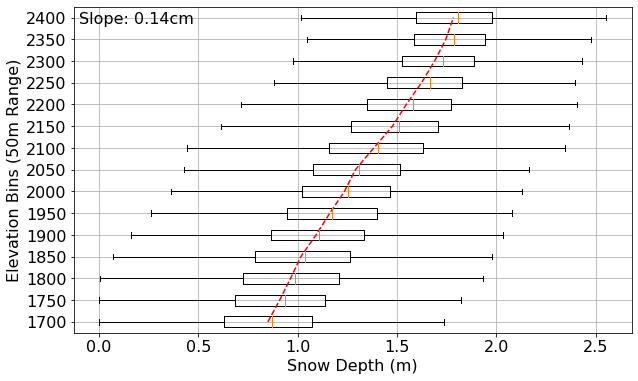

In [151]:
bin_plot('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif',
         elev_file, 50)

How does this vary by aspect category

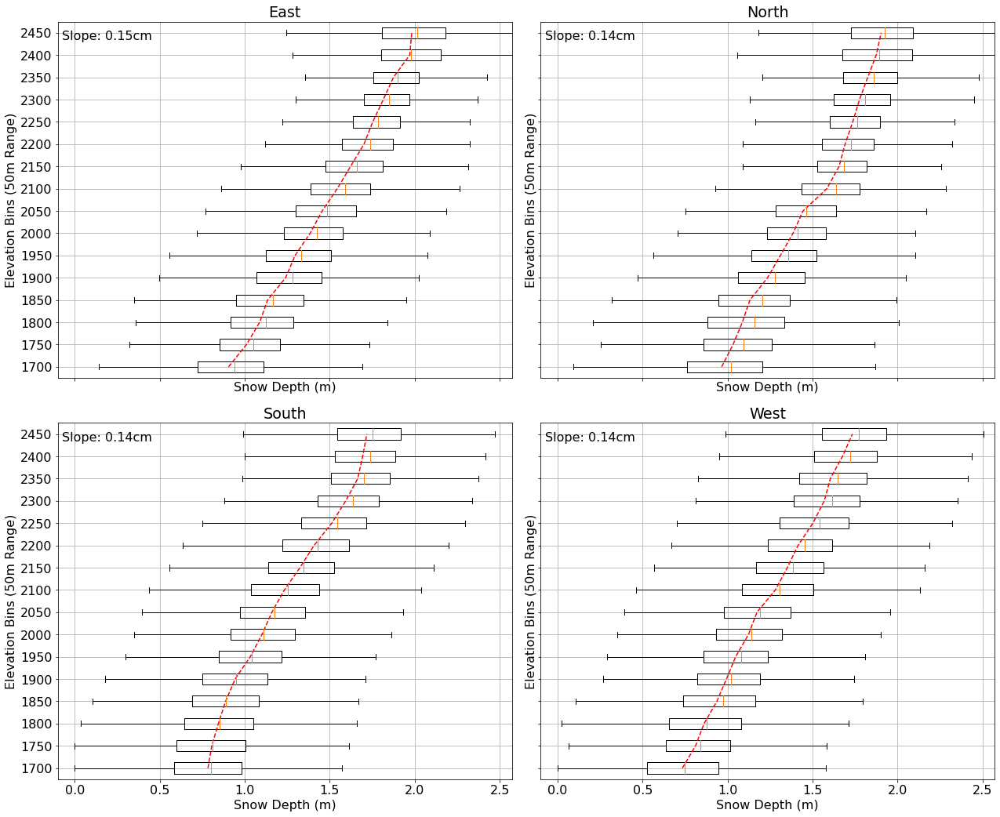

In [153]:
bin_plot2('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif',
         elev_file, 50)

Now let's see how this general pattern vary across season

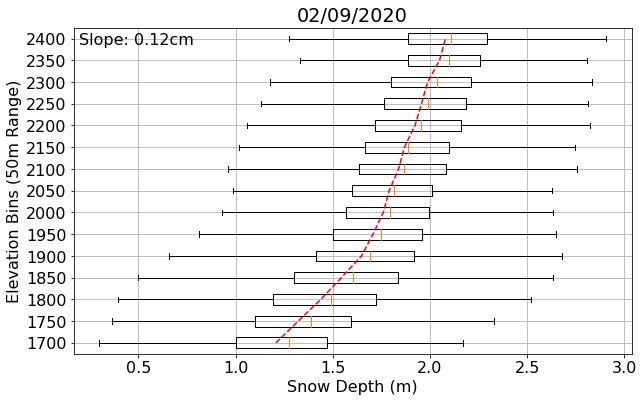

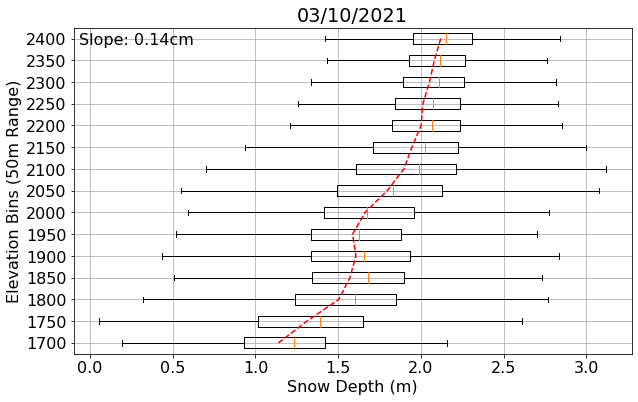

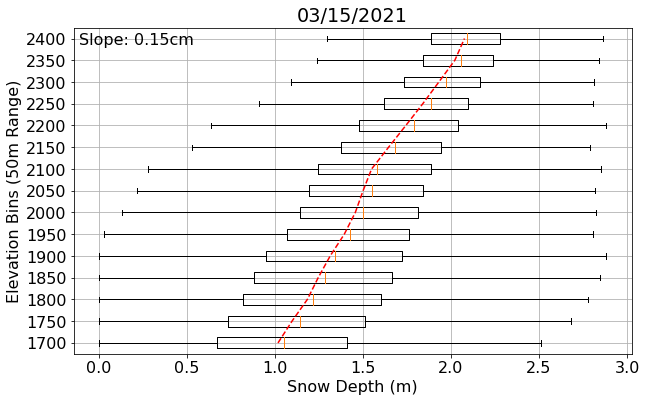

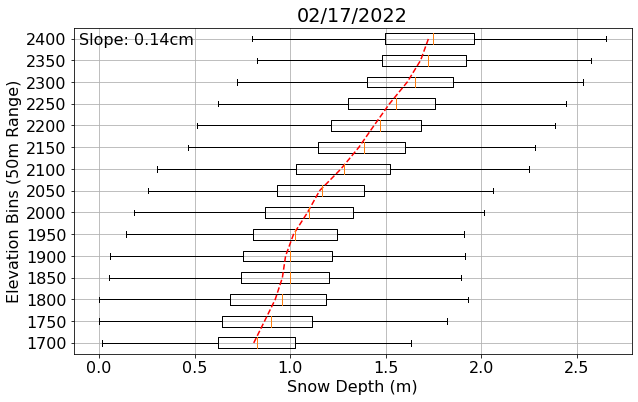

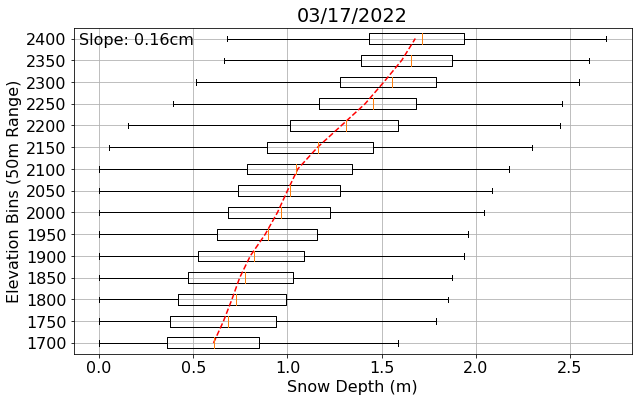

...

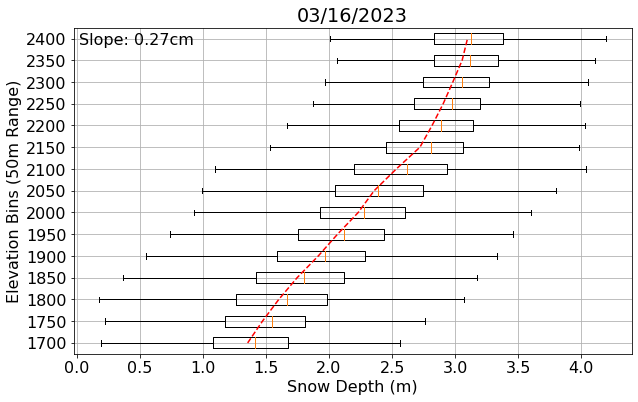

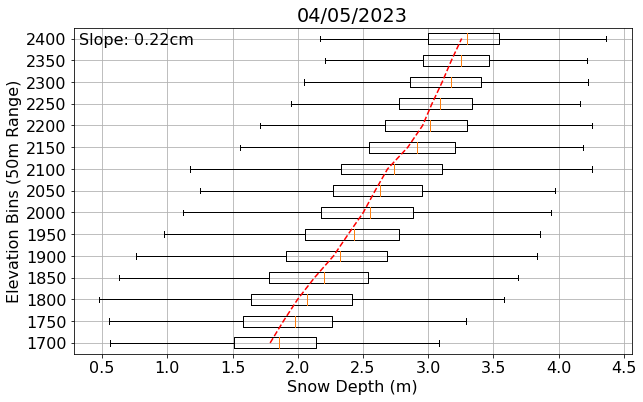

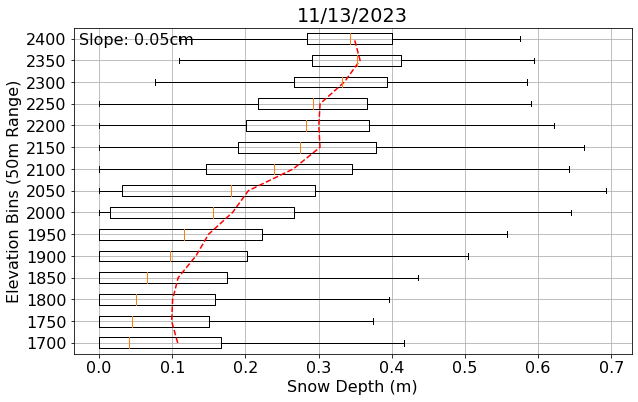

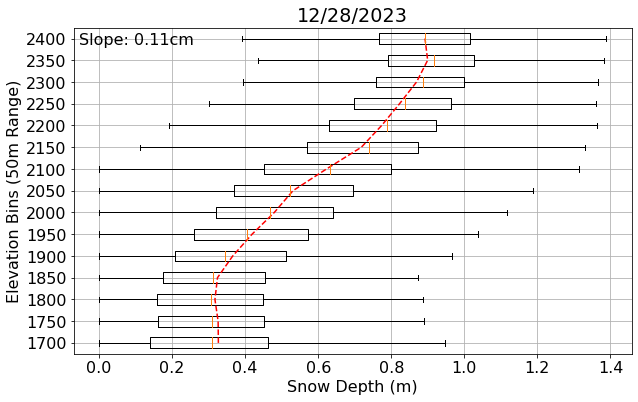

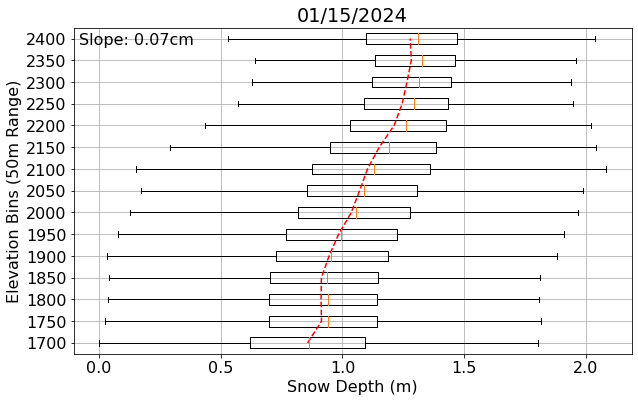

In [154]:
for i in range(len(sdf_files)):   
    bin_plot(sdf_files[i], elev_file, 50, title = Dates[i])

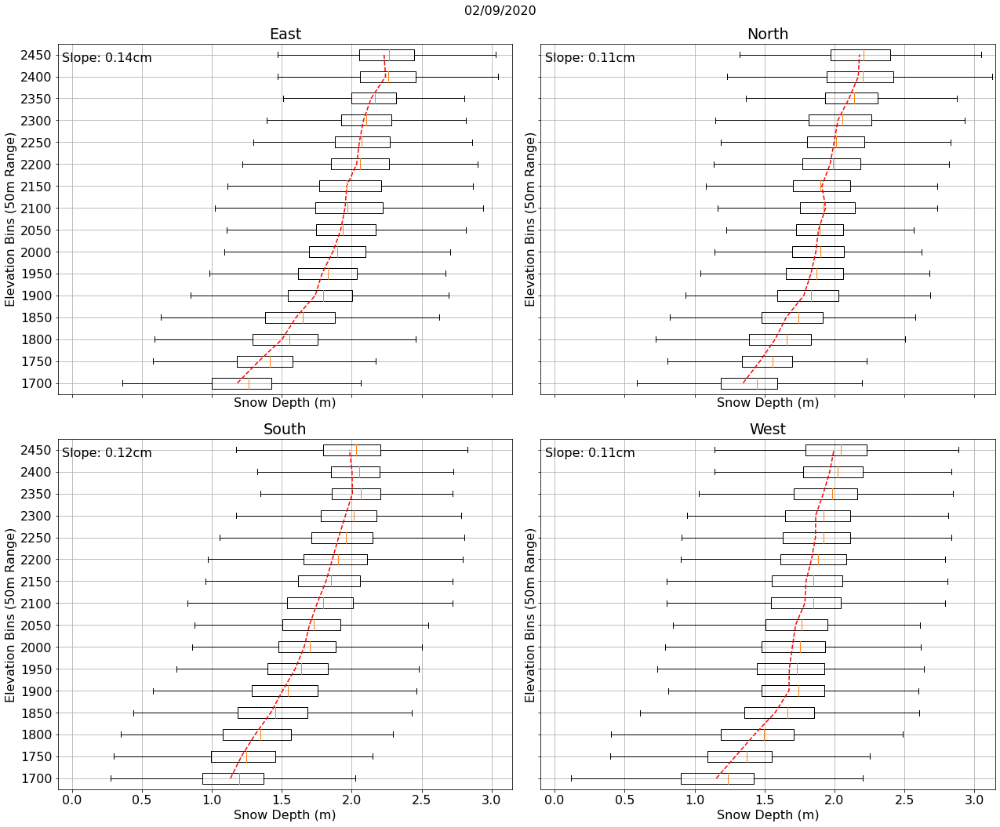

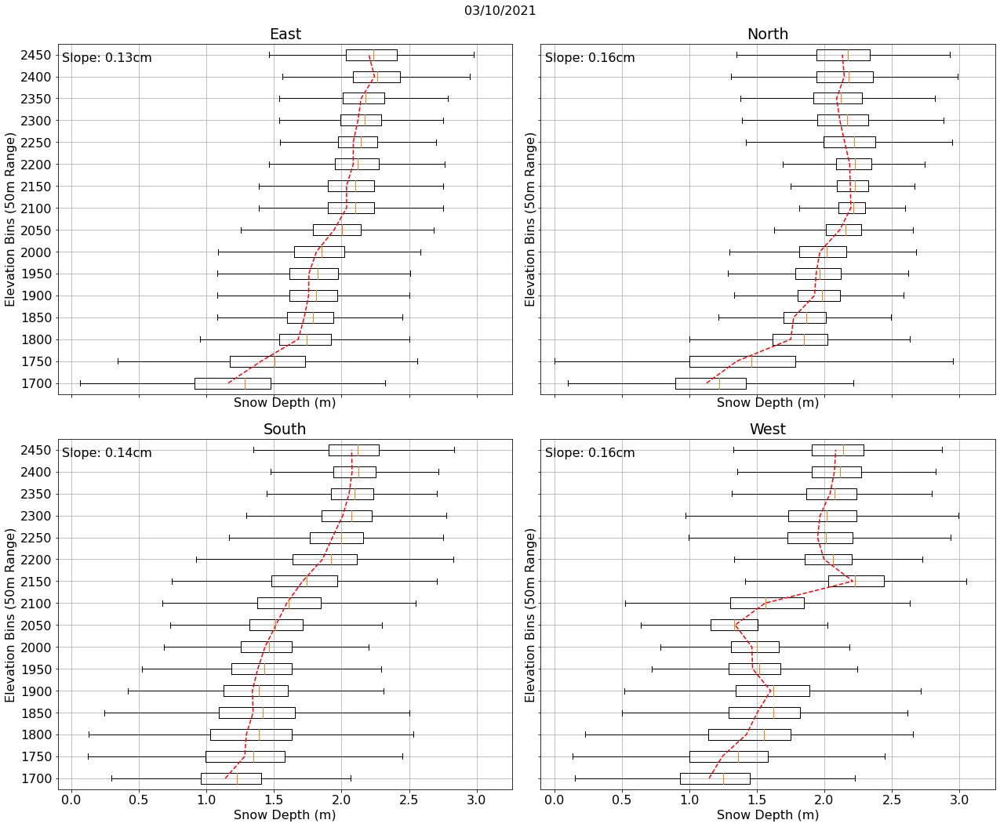

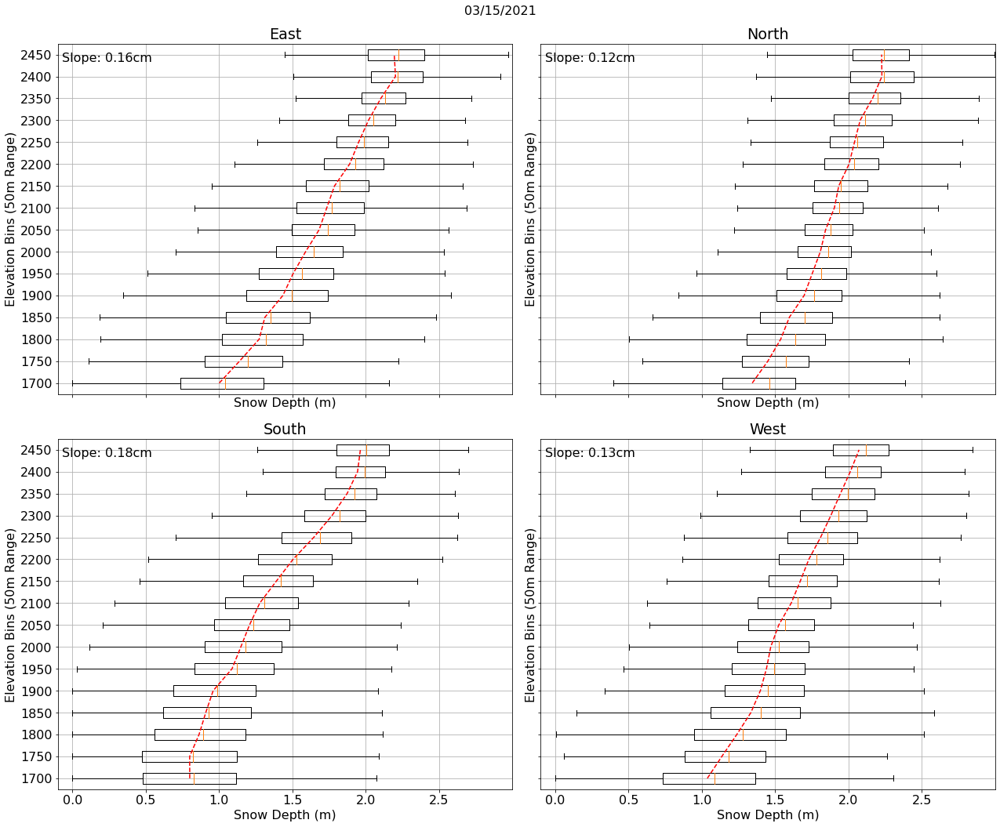

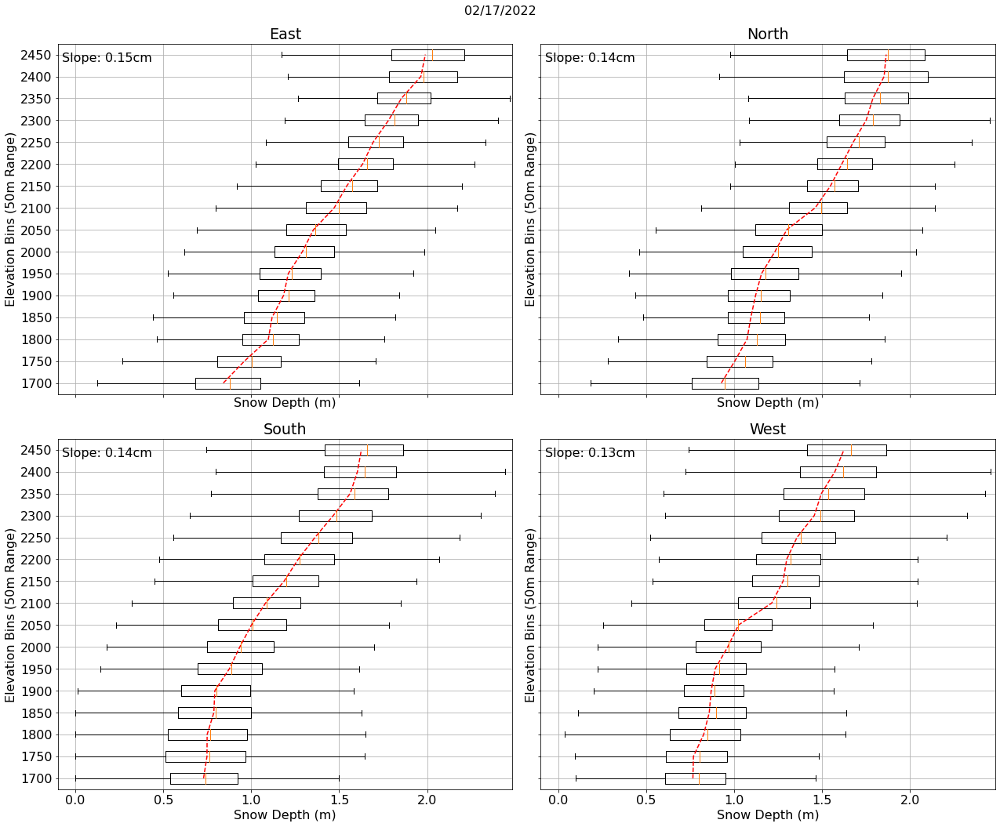

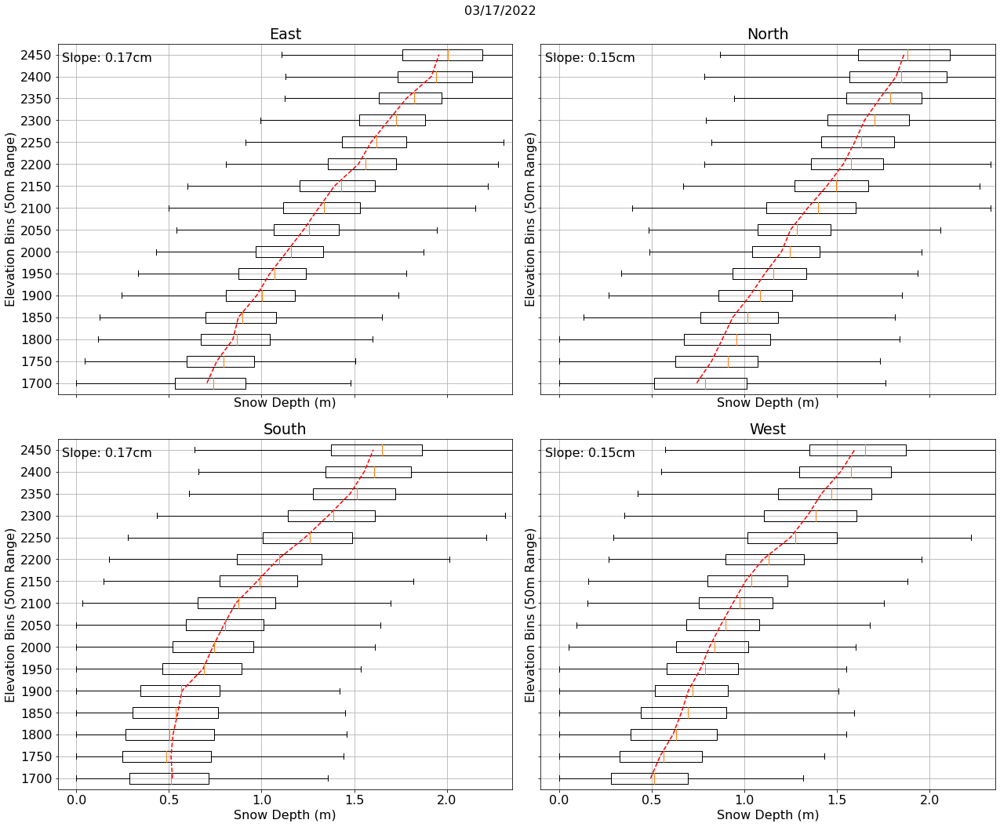

...

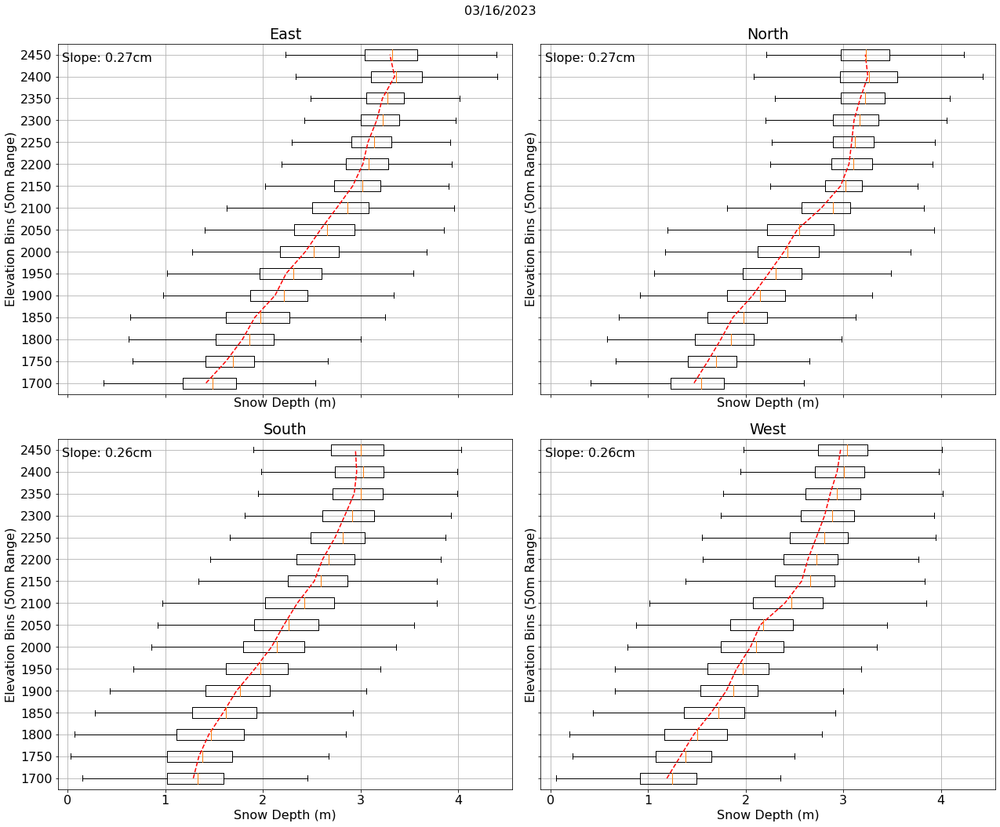

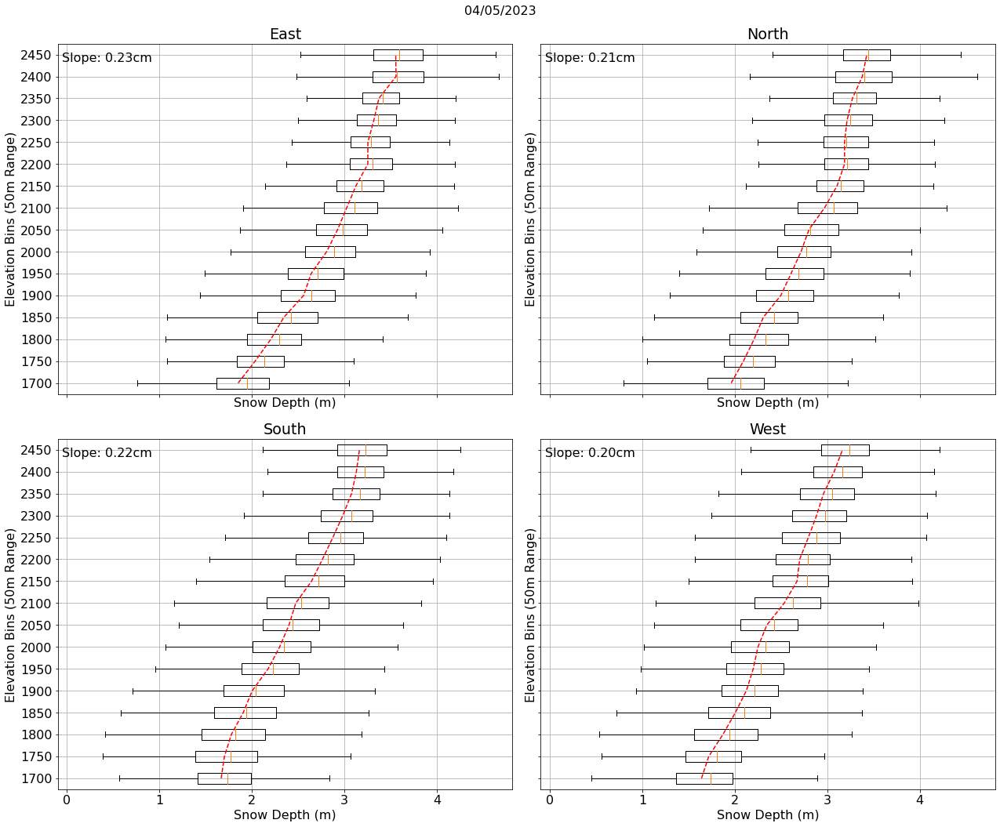

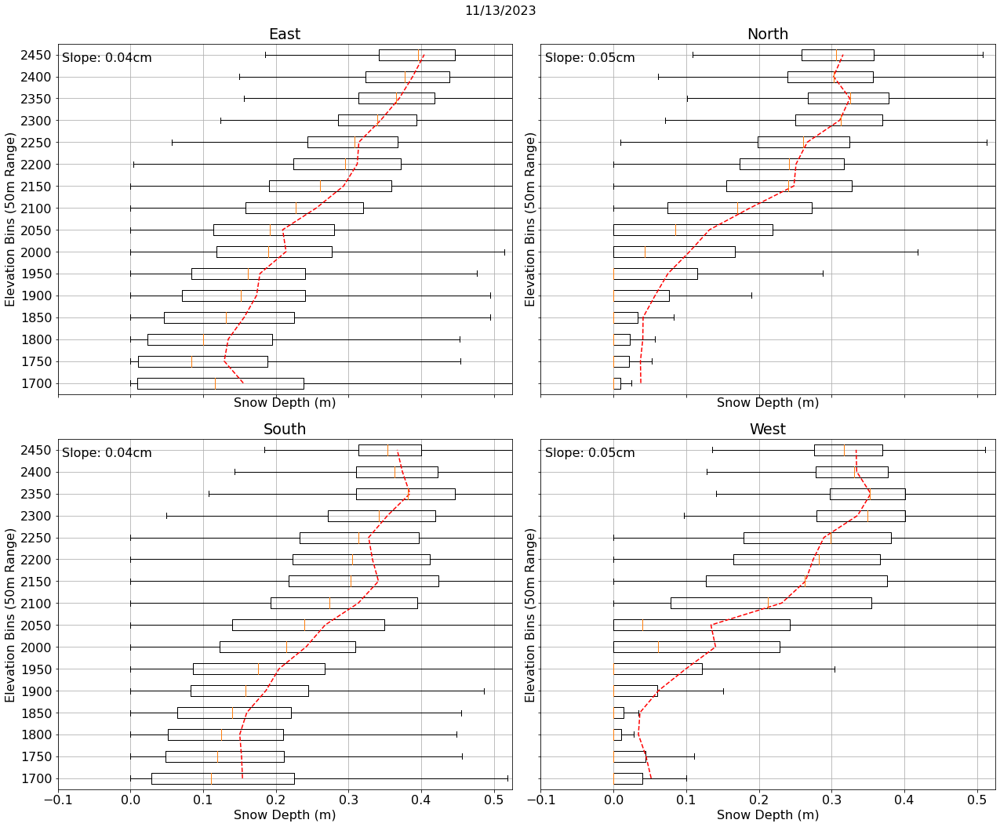

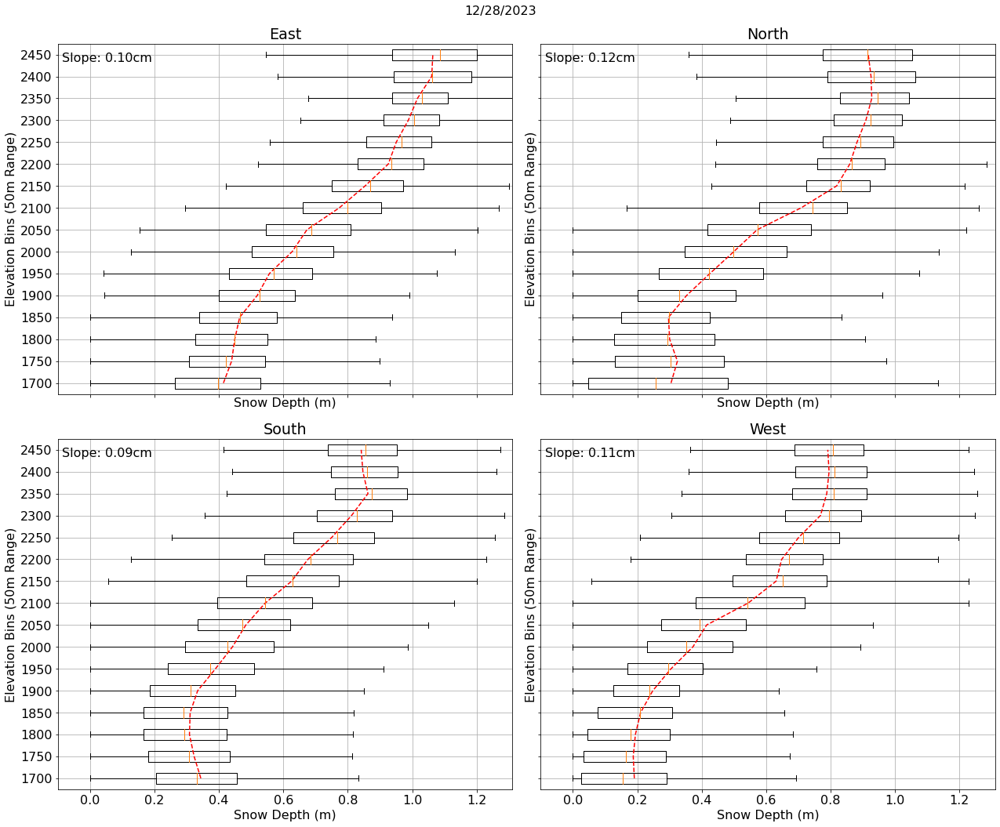

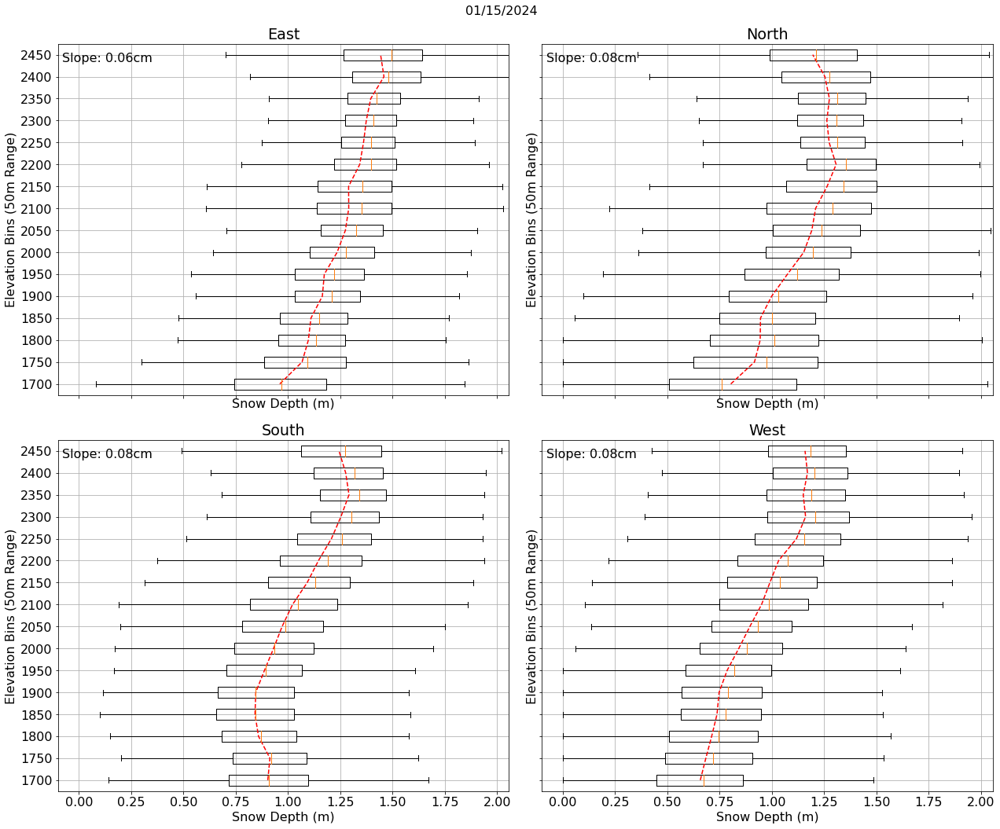

In [155]:
for i in range(len(sdf_files)):   
    bin_plot2(sdf_files[i], elev_file, 50, title = Dates[i])

What can we learn from differencing the temporal average from the snow depth

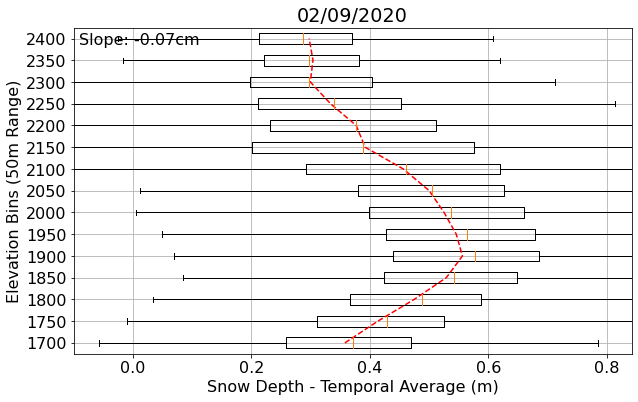

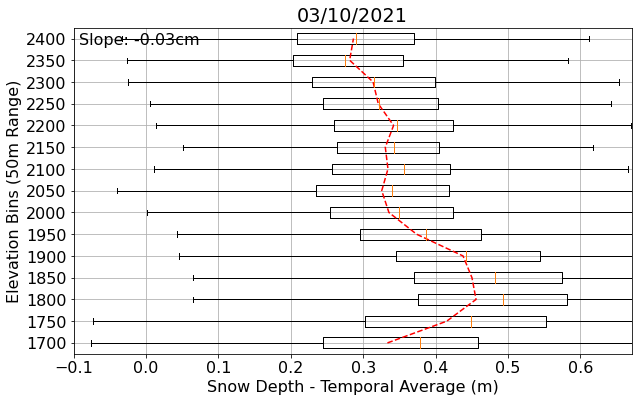

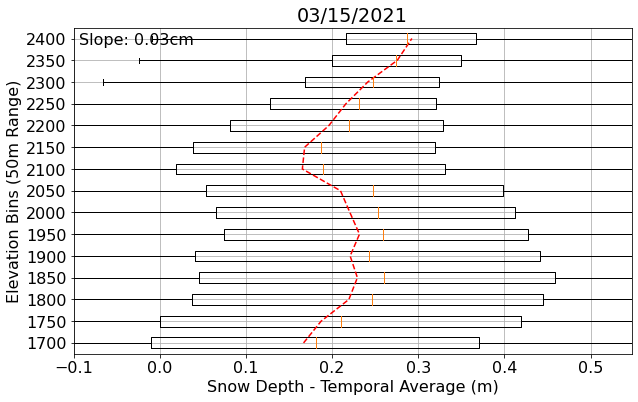

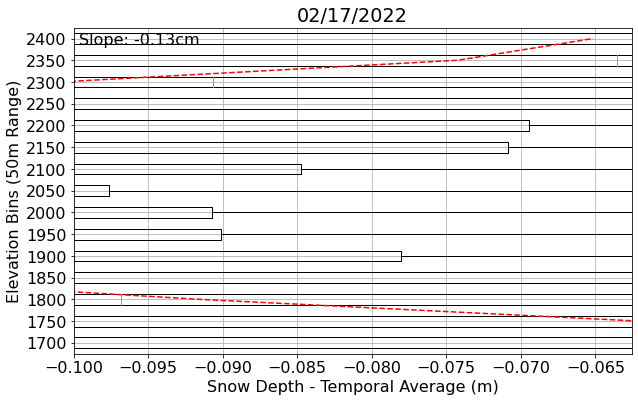

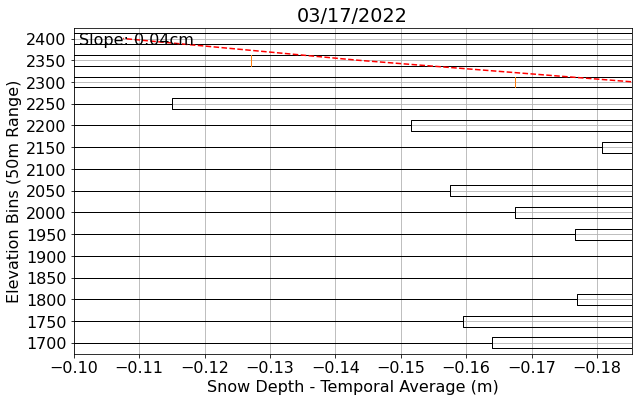

...

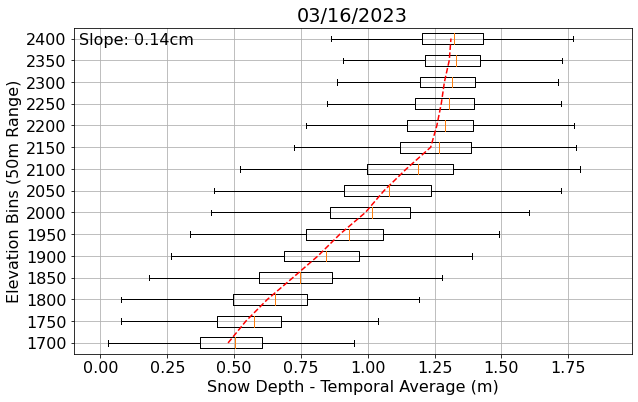

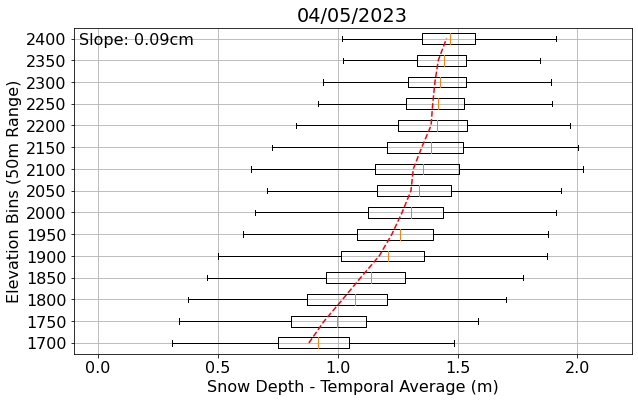

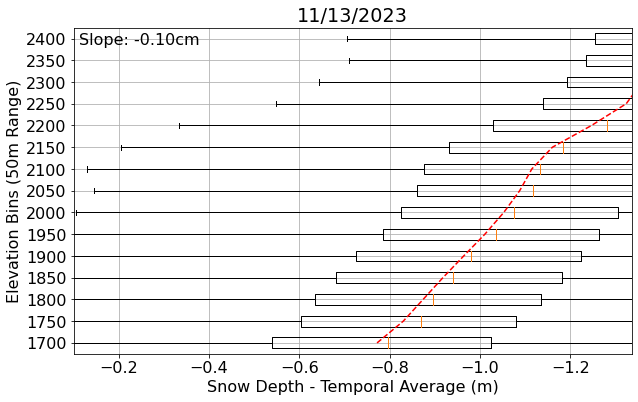

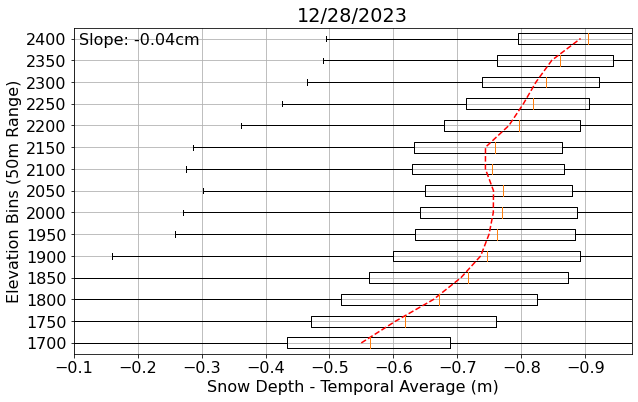

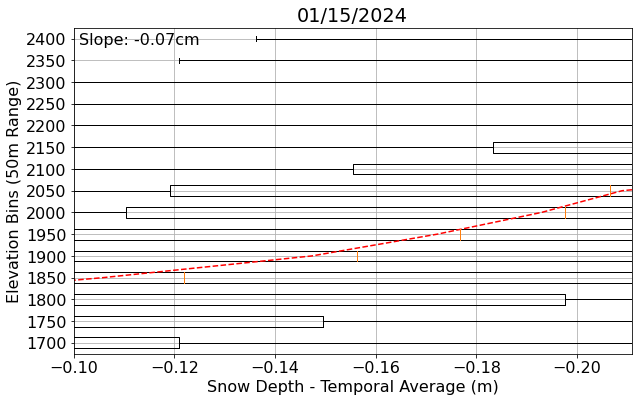

In [156]:
for i in range(len(sdf_files)):   
    bin_plot(sdf_files[i], elev_file, 50, title = Dates[i], difference = True)

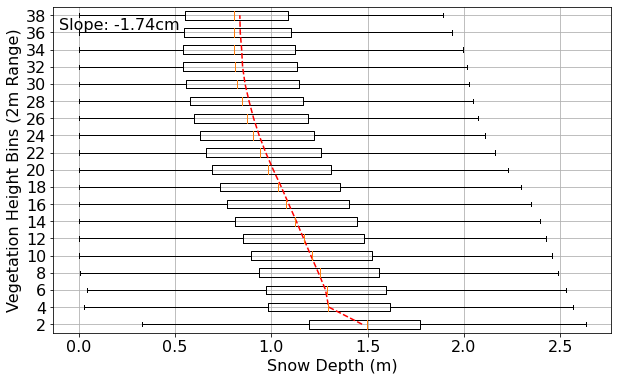

In [9]:
bin_plot('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif',
         vh_file, 2, elevation= 'no')

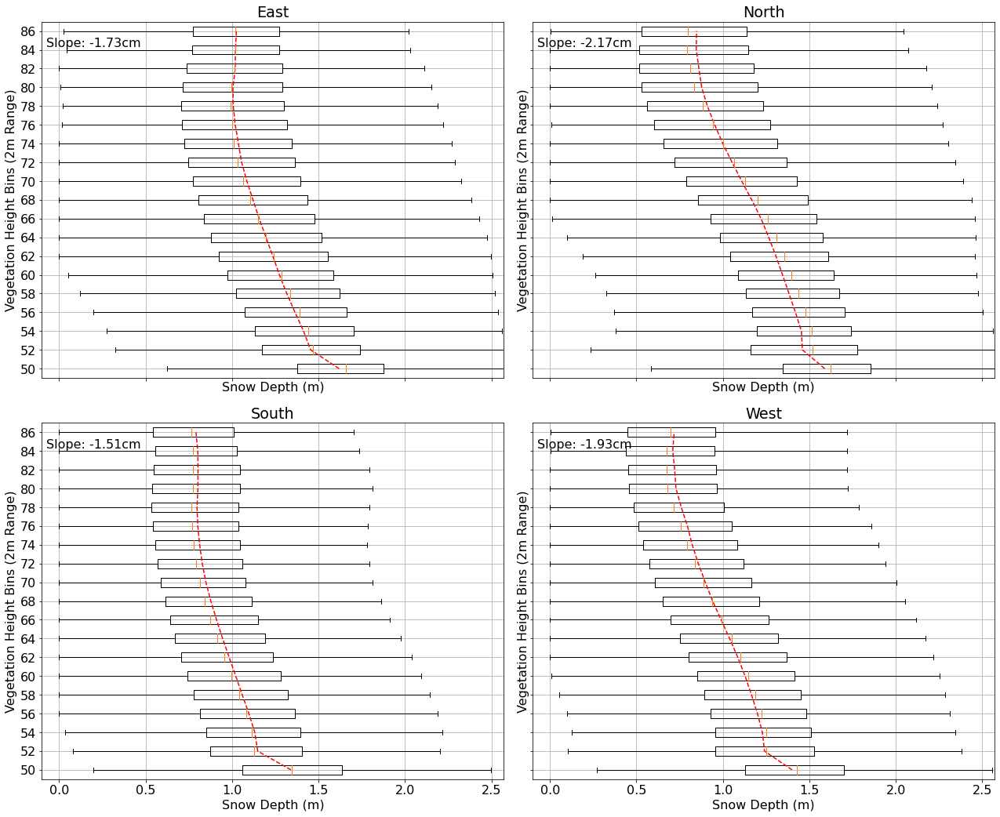

In [15]:
bin_plot2('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/snowdepth/filtered/sdf_average.tif',
         vh_file, 2, elevation= 'no')

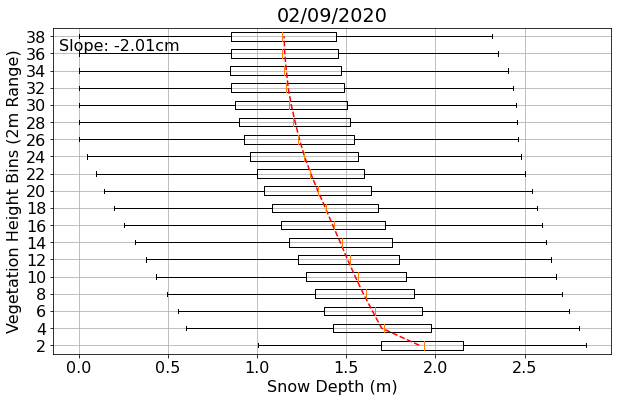

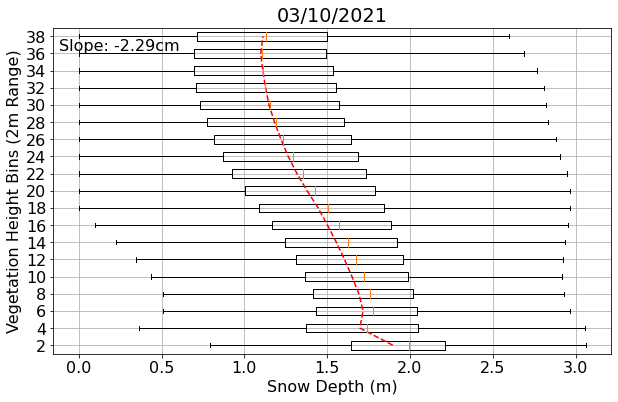

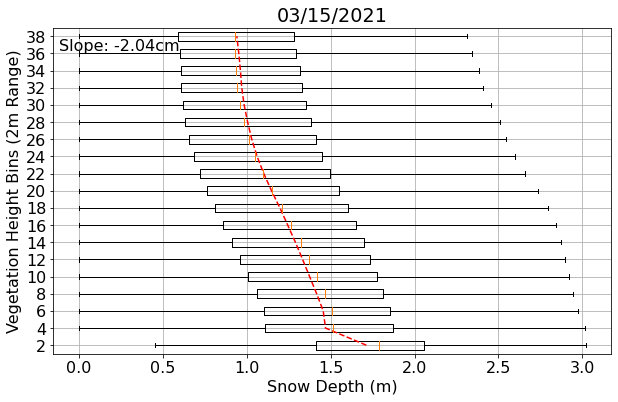

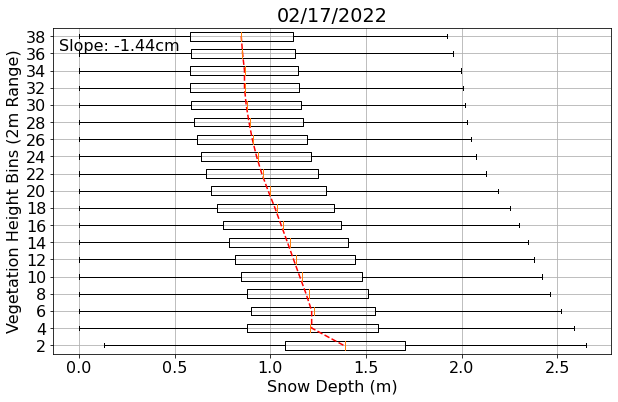

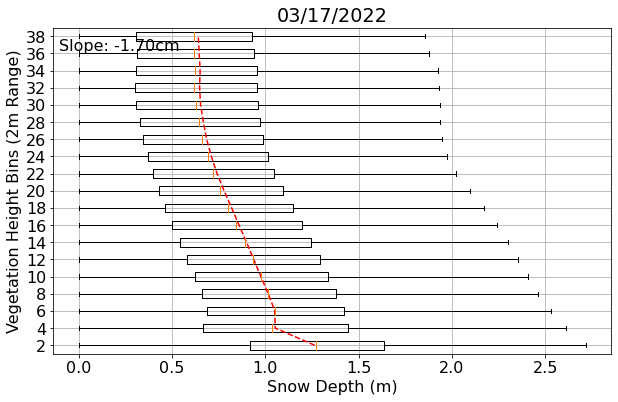

...

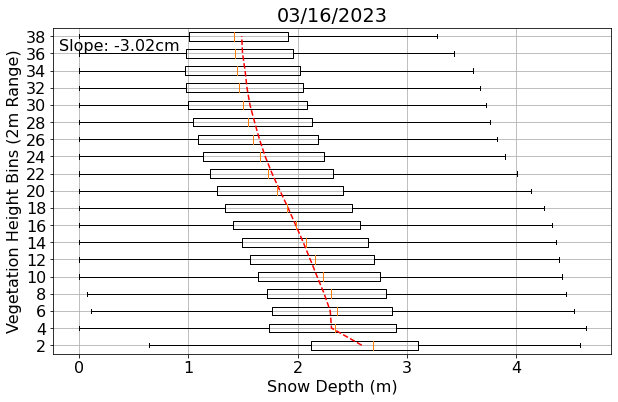

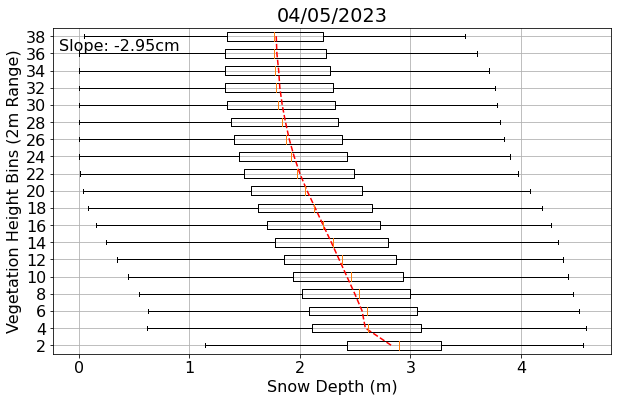

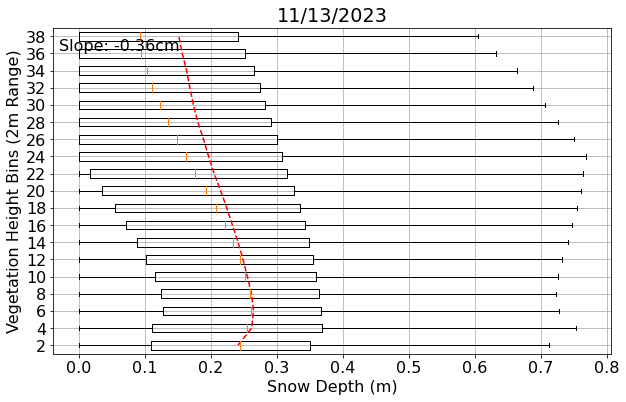

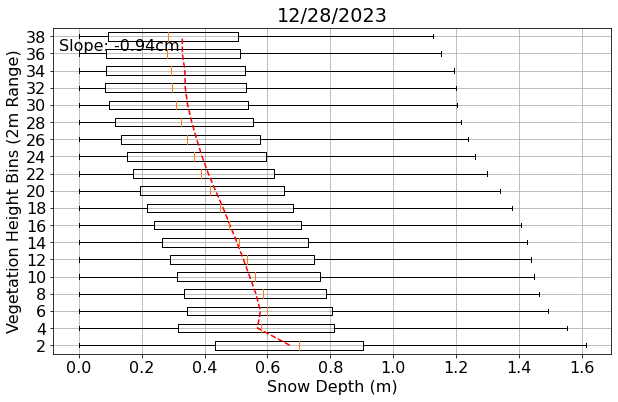

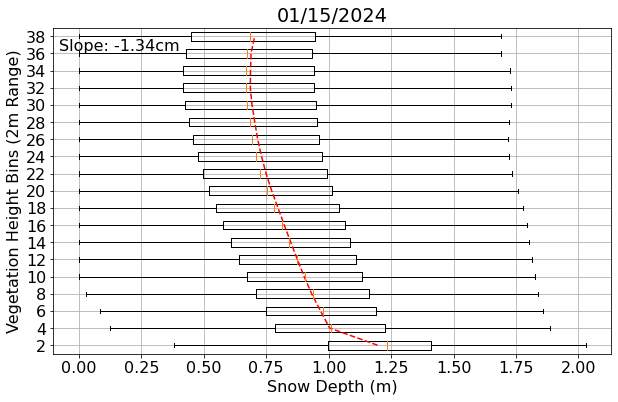

In [18]:
for i in range(len(sdf_files)):   
    bin_plot(sdf_files[i], vh_file, 2, elevation= 'no', title = Dates[i])

## Variable Grouping

In [2]:
data_temporal_df = pd.read_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/all_extract_temporal_average.csv')

In [4]:
data_temporal_df

,Unnamed: 0,Temporal Mean Depth_f,Standardized Depth,Mean Normalized Depth,Snotel Normalized Depth,elev,vh,slope,aspect
0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
264707065,264707065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264707066,264707066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264707067,264707067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264707068,264707068,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#aspect category
conditions = [    (data_temporal_df['aspect'] >= 292.5) | (data_temporal_df['aspect'] < 67.5),
    (data_temporal_df['aspect'] >= 67.5) & (data_temporal_df['aspect'] < 112.5),
    (data_temporal_df['aspect'] >= 112.5) & (data_temporal_df['aspect'] < 247.5),
    (data_temporal_df['aspect'] >= 247.5) & (data_temporal_df['aspect'] < 292.5)
]
choices = ['North', 'East', 'South', 'West']
data_temporal_df['aspect_category'] = np.select(conditions, choices, default=np.nan)

#elevation category
elevation_bin = [100, 1700, 2000, 2300, 2600]
elevation_label = ['Valley [<1700m]', 'Low [1700 - 2000m]', 'Moderate [2000 - 2300m]', 'High [>2300m]']
data_temporal_df['elev_category'] = pd.cut(data_temporal_df['elev'], bins = elevation_bin, labels = elevation_label)

#vegetation category
vegetation_bin = [0, 0.5, 2, 5, 40]
vegetation_label = ['open-sparse [< 0.5m]', 'Moderate [0.5 - 2m]', 'Tall [2 - 5m]', 'Very Tall [> 5m]']
data_temporal_df['vh_category'] = pd.cut(data_temporal_df['vh'], bins = vegetation_bin, labels = vegetation_label)

#slope category
slope_bin = [0, 15, 30, 45, 90]
slope_label = ['Gentle [< 15]', 'Moderate [15 -30]', 'Steep [30 - 45]', 'Very Steep [> 45]']
data_temporal_df['slope_category'] = pd.cut(data_temporal_df['slope'], bins = slope_bin, labels= slope_label)



In [10]:
data_temporal_df.to_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/all_extract_temporal_average.csv')

In [30]:
pd.read_csv('/nfs_home/naheemadebisi/snow-analytics/lidar_mcs/results/all_extract_temporal_average.csv')

,Unnamed: 0,Temporal Mean Depth_f,Standardized Depth,elev,vh,slope,aspect
0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
264707065,264707065,NaN,NaN,NaN,NaN,NaN,NaN
264707066,264707066,NaN,NaN,NaN,NaN,NaN,NaN
264707067,264707067,NaN,NaN,NaN,NaN,NaN,NaN
264707068,264707068,NaN,NaN,NaN,NaN,NaN,NaN
